#🚀 **Démystifions l'IA : Détection de cancer du sein avec le code !** 🚀

# Bienvenue dans cet atelier !

**Objectif:** Explorer comment l'intelligence artificielle peut aider à détecter le cancer du sein à partir d'images médicales. \
**Prérequis:** Aucun ! Juste de la curiosité et l'envie d'apprendre. 😊 \
**Outil:** Google Colab (pas besoin d'installer quoi que ce soit !)

## Étape 1 : Installation et chargement des données

On va utiliser un jeu de données (dataset), qui contient des mammographies.
Pour simplifier, on va travailler avec les images déjà converties en format JPEG (plus facile à manipuler).

In [21]:
# Import des librairies nécessaires
import kagglehub  # Pour télécharger facilement des datasets depuis Kaggle
import os  # Pour interagir avec le système de fichiers (trouver les chemins des images, etc.)

import matplotlib.pyplot as plt  # Pour afficher des images et des graphiques
import matplotlib.image as mpimg  # Pour lire les images

import cv2  # OpenCV : librairie très puissante pour le traitement d'images
import numpy as np  # Pour manipuler des tableaux de nombres (les images sont des tableaux de pixels)

import tensorflow as tf  # TensorFlow : la librairie de Google pour le deep learning
from tensorflow.keras.models import Sequential  # Pour créer un modèle séquentiel (couches empilées)
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout  # Les différentes couches de notre réseau

import pandas as pd  # Pour manipuler des données structurées (tableaux)
from sklearn.model_selection import train_test_split  # Pour diviser le dataset en entraînement et validation


In [22]:
# Récupérer le dataset de Kaggle
# https://www.kaggle.com/datasets/aryashah2k/breast-ultrasound-images-dataset

path = kagglehub.dataset_download("aryashah2k/breast-ultrasound-images-dataset")
print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/aryashah2k/breast-ultrasound-images-dataset/versions/1


In [23]:
# Obtenir le chemin contenant le dossier des images
img_dir = ''
for files in os.listdir(path):
  files_dir = os.path.join(path, files)
  img_dir = os.path.join(path, files_dir)
  print("Path : ", img_dir)

Path :  /root/.cache/kagglehub/datasets/aryashah2k/breast-ultrasound-images-dataset/versions/1/Dataset_BUSI_with_GT


## Exploration et affichage des images

In [24]:
# Fonction pour recuperer tous les chemins de fichiers
def get_all_files_path(root_dir: str) -> list:
    """
    Récupère récursivement les chemins de tous les fichiers dans un répertoire.

    Args:
        root_dir: Le répertoire racine à explorer.

    Returns:
        Une liste contenant les chemins absolus de tous les fichiers (sauf ceux contenant "_mask").
    """
    all_files = []
    for root, _, files in os.walk(root_dir):  # Parcours récursif de l'arborescence
        for file in files:
            if "_mask" not in file:  # On ne veut pas garder les images transformées (masques)
                all_files.append(os.path.join(root, file))  # Chemin absolu du fichier
    return all_files

In [25]:
# Liste de tous les *fichiers image* d'entraînement (on se concentre sur l'entraînement pour l'instant)
train_files = get_all_files_path(img_dir)
print(f"Nombre total d'images d'entraînement: {len(train_files)}")

Nombre total d'images d'entraînement: 780


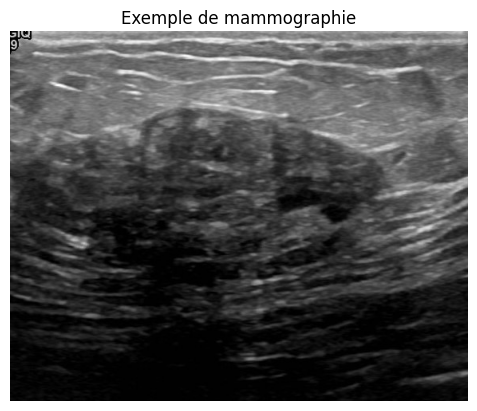

Chemin de l'image : /root/.cache/kagglehub/datasets/aryashah2k/breast-ultrasound-images-dataset/versions/1/Dataset_BUSI_with_GT/malignant/malignant (68).png


In [26]:
# Afficher une image au hasard
sample_image_path = train_files[0]   # Chemin d'une image d'entraînement
img = mpimg.imread(sample_image_path) # Lecture de l'image avec matplotlib
plt.imshow(img, cmap='gray')  # Afficher l'image en niveaux de gris
plt.title("Exemple de mammographie")
plt.axis('off')  # Masquer les axes
plt.show()
print("Chemin de l'image :", sample_image_path)

## Étape 2 : Prétraitement et nettoyage des images

Le prétraitement des images est crucial en deep learning pour plusieurs raisons :

Standardisation : Les réseaux de neurones fonctionnent mieux avec des données d'entrée standardisées. Cela signifie :

Taille uniforme : Toutes les images doivent avoir la même taille (hauteur, largeur) pour pouvoir être traitées en batch. On redimensionne donc à 224x224 pixels.
Plage de valeurs cohérente : Les valeurs des pixels doivent être dans une plage connue et limitée. La normalisation (division par 255.0) ramène les valeurs entre 0 et 1.
Amélioration de la qualité :

Contraste : Le cancer du sein peut être difficile à distinguer des tissus sains sur une mammographie. L'amélioration du contraste (avec CLAHE) aide à faire ressortir les détails importants.
Réduction du bruit : Bien que le code n'inclue pas explicitement de réduction de bruit, c'est une étape de prétraitement courante qui peut améliorer les performances.
Compatibilité avec le modèle :

Format des données : TensorFlow attend des images avec une dimension de canal explicite (même pour les images en niveaux de gris). np.expand_dims ajoute cette dimension.
En résumé, le prétraitement transforme les images brutes en un format optimal pour l'apprentissage par le réseau de neurones, ce qui améliore la précision et la robustesse du modèle.  Sans prétraitement, le modèle pourrait avoir du mal à apprendre, voire ne pas converger du tout.

In [27]:
def preprocess_image(image_path):
    """
    Prétraite une image :
        1. Lecture en niveaux de gris.
        2. Redimensionnement à une taille standard (224x224 pixels).
        3. Amélioration du contraste avec CLAHE.
        4. Normalisation des valeurs de pixels entre 0 et 1.
        5. Ajout d'une dimension de canal (nécessaire pour TensorFlow).

    Args:
        image_path: Le chemin de l'image à prétraiter.

    Returns:
        L'image prétraitée sous forme de tableau NumPy.
    """
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Lecture en niveaux de gris
    img = cv2.resize(img, (224, 224))  # Redimensionner à une taille standard (224x224)

    # Améliorer le contraste avec CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img = clahe.apply(img)

    img = img / 255.0     # Normaliser les pixels : valeurs entre 0 et 1
    img = np.expand_dims(img, axis=-1)  # Ajouter une dimension de canal (pour TensorFlow)
    return img

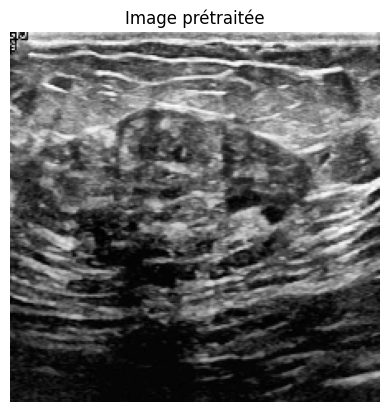

In [28]:
# Exemple avec l'image précédente
processed_img = preprocess_image(sample_image_path)
plt.imshow(processed_img, cmap='gray') # Afficher l'image en niveaux de gris.
plt.title("Image prétraitée")
plt.axis('off')
plt.show()

## Étape 3 : Création du modèle CNN

In [29]:
def create_cnn_model():
    """
    Crée un modèle CNN (Convolutional Neural Network) simple pour la classification binaire.

    Le modèle est composé de :
        - Couches de convolution (Conv2D) pour extraire les caractéristiques des images.
        - Couches de pooling (MaxPooling2D) pour réduire la dimension des données et le temps de calcul.
        - Une couche d'aplatissement (Flatten) pour convertir les données 2D en un vecteur 1D.
        - Couches denses (Dense) pour la classification.
        - Une couche de Dropout pour la régularisation (éviter le surapprentissage).

    Returns:
        Un modèle Keras non compilé.
    """
    model = Sequential([
        # Première couche de convolution : 32 filtres de taille 3x3, fonction d'activation ReLU
        Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1)),
        MaxPooling2D((2, 2)),  # Réduit la taille de l'image par 2

        # Deuxième couche de convolution : 64 filtres 3x3, activation ReLU
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),

        # Troisième couche de convolution : 128 filtres 3x3, activation ReLU
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),

        Flatten(),  # Aplatit les données en un vecteur 1D

        # Couche dense (fully connected) : 128 neurones, activation ReLU
        Dense(128, activation='relu'),
        Dropout(0.5),  # Dropout pour la régularisation (50% des neurones désactivés aléatoirement)

        # Couche de sortie : 1 neurone (classification binaire), activation sigmoïde
        Dense(1, activation='sigmoid')  # Sigmoïde pour obtenir une probabilité entre 0 et 1
    ])
    return model

In [30]:
# Création et compilation du modèle
model = create_cnn_model()

# Compilation du modèle
model.compile(optimizer='adam',  # Optimiseur Adam : algorithme de descente de gradient
              loss='binary_crossentropy',  # Fonction de perte pour la classification binaire
              metrics=['accuracy'])  # Métrique d'évaluation : précision

# Affichage du résumé du modèle
model.summary()

model.build(input_shape=(None, 224, 224, 1))  # None pour la taille du batch

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,168,513 (42.60 MB)

 Trainable params: 11,168,513 (42.60 MB)

 Non-trainable params: 0 (0.00 B)

# Explication des concepts :
   - CNN (Convolutional Neural Network) :  Un type de réseau de neurones profond particulièrement adapté au traitement des images. Il utilise des couches de convolution pour extraire automatiquement des caractéristiques pertinentes (bords, textures, etc.).
   - Couche de convolution (Conv2D) : Applique des filtres (petites matrices) à l'image pour détecter des motifs.  Chaque filtre produit une "carte d'activation" qui indique où le motif est présent.
   - Couche de pooling (MaxPooling2D) : Réduit la taille des cartes d'activation en ne gardant que la valeur maximale dans une petite fenêtre (souvent 2x2). Cela réduit le bruit et le temps de calcul.
   - Fonction d'activation (ReLU, sigmoïde) :  Introduit de la non-linéarité dans le réseau, ce qui lui permet d'apprendre des relations complexes. ReLU (Rectified Linear Unit) est souvent utilisée dans les couches cachées, tandis que la sigmoïde est courante pour la classification binaire en sortie (probabilité entre 0 et 1).
   - Dropout :  Une technique de régularisation qui "éteint" aléatoirement certains neurones pendant l'entraînement. Cela force le réseau à apprendre des représentations plus robustes et évite le surapprentissage (overfitting).
   - Optimiseur (Adam) : Un algorithme qui ajuste les poids du réseau pendant l'entraînement pour minimiser la fonction de perte. Adam est une variante populaire de la descente de gradient.
   - Fonction de perte (binary_crossentropy) : Mesure l'erreur entre les prédictions du modèle et les vraies valeurs.  La binary_crossentropy est adaptée à la classification binaire.



## Création du dataset

In [31]:
# Creation du dataset Tensorflow
def create_dataset(dataframe):
    """
    Crée un dataset TensorFlow à partir d'un DataFrame pandas.

    Args:
        dataframe: Le DataFrame contenant les chemins des images et les labels.

    Returns:
        Un dataset TensorFlow prêt pour l'entraînement ou la validation.
    """
    # Crée un dataset à partir des chemins des images et des labels
    ds = tf.data.Dataset.from_tensor_slices((dataframe['filename'].values, dataframe['label'].values))

    def load_and_preprocess(image_path, label):
        """Charge et prétraite une image à partir de son chemin."""
        img = tf.io.read_file(image_path)  # Lit le fichier image
        img = tf.image.decode_jpeg(img, channels=1)  # Décode l'image JPEG (niveaux de gris)
        img = tf.image.resize(img, [224, 224])  # Redimensionne à 224x224
        img = tf.cast(img, tf.float32) / 255.0  # Normalise les pixels (float32)
        return img, label

    # Applique la fonction de chargement et de prétraitement à chaque élément du dataset
    ds = ds.map(load_and_preprocess)
    # Crée des batchs de taille 32 (regroupe 32 images)
    ds = ds.batch(32)
    # Prépare les batchs suivants en arrière-plan (optimisation)
    ds = ds.prefetch(tf.data.AUTOTUNE)
    return ds


In [32]:
# Créer le dataframe avec le chemin de l'image est son label ()
labels = [1 if "malignant" in f else 0 for f in train_files] # 1 si malin, 0 sinon
df = pd.DataFrame({"filename": train_files, "label": labels})


# Séparation des données en ensembles d'entraînement et de validation
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42) # 80% train, 20% validation

# Création des datasets d'entraînement et de validation
train_ds = create_dataset(train_df)
val_ds = create_dataset(val_df)

## Étape 4 : Entraînement du modèle

In [33]:
history = model.fit(
    train_ds,  # Le dataset d'entraînement
    epochs=5,  # Nombre d'époques (passages complets sur le dataset)
    validation_data=val_ds  # Le dataset de validation
)

# Explication :
#   - Epoch : Un passage complet sur l'ensemble du dataset d'entraînement.  Pendant une epoch,
#     le modèle voit toutes les images d'entraînement, ajuste ses poids, et calcule la perte
#     (l'erreur) et les métriques (comme la précision).  Plus il y a d'epochs, plus le modèle
#     a l'opportunité d'apprendre, mais attention au surapprentissage !


Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 67s 3s/step - accuracy: 0.6258 - loss: 0.8675 - val_accuracy: 0.7628 - val_loss: 0.5265
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 66s 2s/step - accuracy: 0.7042 - loss: 0.5803 - val_accuracy: 0.7628 - val_loss: 0.5242
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 84s 3s/step - accuracy: 0.7042 - loss: 0.5085 - val_accuracy: 0.7628 - val_loss: 0.4915
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.7168 - loss: 0.4661 - val_accuracy: 0.8141 - val_loss: 0.4521
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.7599 - loss: 0.4124 - val_accuracy: 0.7949 - val_loss: 0.4595


## Étape 5 : Évaluation du modèle

In [34]:
loss, accuracy = model.evaluate(val_ds)  # Évalue le modèle sur le dataset de validation
print(f"Perte (loss) sur l'ensemble de validation : {loss:.4f}")
print(f"Précision (accuracy) sur l'ensemble de validation : {accuracy:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 670ms/step - accuracy: 0.7880 - loss: 0.4300
Perte (loss) sur l'ensemble de validation : 0.4595
Précision (accuracy) sur l'ensemble de validation : 0.7949


# Exercices

### 1. Appliquer différentes transformations aux images
### 2. Visualiser les couches du modèle et comprendre leur rôle
### 3. Afficher des images avec leurs prédictions et niveaux de confiance du modèle
### 4. Vérifier si le modèle a tendance à faire plus d'erreurs sur certains types d'images
### 5. Trouver des exemples où le modèle s'est trompé et essayer d'expliquer pourquoi.


Documentation / Aide :     
https://www.tensorflow.org/api_docs/python/tf/image \


- ```tf.random.uniform(()) > 0.5```: façon de décider aléatoirement si on applique la transformation ou non (pile ou face).
- ```tf.image.rot90()```: Rotation par multiples de 90 degrés. k est le nombre de rotations de 90 degrés.
- ```tf.image.random_flip_left_right()```: Miroir horizontal.
- ```tf.image.random_flip_up_down()```: Miroir vertical.
- ```tf.image.random_brightness()```: Changement aléatoire de luminosité. max_delta contrôle l'amplitude du changement.
- ```tf.image.random_contrast()``` : Ajouter une fonction de variation de contrast ici serait pertinent, et les etudiantes pourraient le faire.

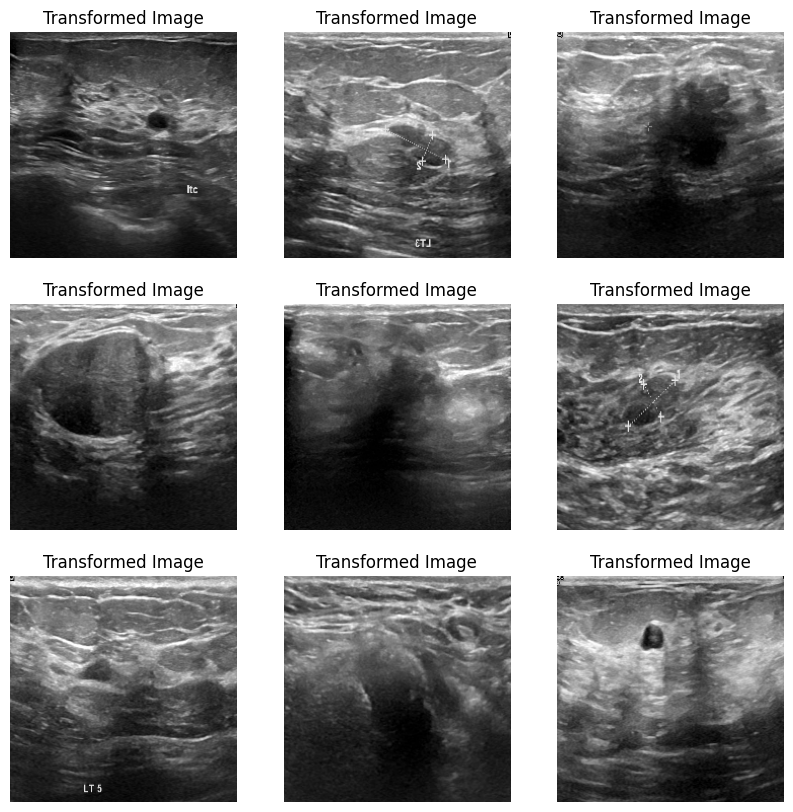

In [36]:
# ### 1. Appliquer différentes transformations aux images

# **Quoi ?**  Les transformations d'images (ou augmentation de données) sont des modifications
# aléatoires appliquées aux images pendant l'entraînement.
# **Pourquoi ?**  Cela permet d'augmenter artificiellement la taille du dataset et de rendre le
# modèle plus robuste aux variations (rotation, zoom, luminosité, etc.).
# **Comment ?**  On peut utiliser les fonctions de `tf.image` ou des librairies comme `ImageDataGenerator` de Keras.
print("\nExercice 1: Appliquer différentes transformations aux images")
def apply_random_transformations(image, label):
    """Applique des transformations aléatoires à une image."""

    # Rotation aléatoire
    if tf.random.uniform(()) > 0.5:
      image = tf.image.rot90(image, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))

    # Translation horizontale aléatoire
    if tf.random.uniform(()) > 0.5:
      image = tf.image.random_flip_left_right(image)

    # Zoom aléatoire
    if tf.random.uniform(()) > 0.5:
      zoom = tf.random.uniform(shape=[2], minval=0.8, maxval=1.2)  # Zoom entre 0.8x et 1.2x
      new_size = [int(224 * zoom[0]), int(224 * zoom[1])]
      image = tf.image.resize(image, new_size)
      image = tf.image.resize_with_crop_or_pad(image, 224, 224)  # Recadre ou ajoute du padding

    # Modification de la luminosité
    if tf.random.uniform(()) > 0.5:
      image = tf.image.random_brightness(image, max_delta=0.2) # Variation de luminosité


    # --- AJOUTEZ VOTRE CODE ICI ---
    # 1. Ajouter une translation verticale
    # 2. Ajouter une transformation de contraste
    # 3. Ajouter une translation (tf.roll)
    # 4. Expérimentez avec les paramètres de toutes les transformations !


    return image, label

# On applique la fonction de transformations aléatoires aux images du dataset d'entraînement.
# On n'applique *pas* de transformations au dataset de validation.
transformed_train_ds = train_ds.map(apply_random_transformations)

# Visualisons quelques images transformées
plt.figure(figsize=(10, 10))
for images, labels in transformed_train_ds.take(1):  # Prend un batch d'images
    for i in range(9):  # Affiche 9 images
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy(), cmap="gray")
        plt.title("Transformed Image")
        plt.axis("off")
plt.show()


Exercice 2 : Visualiser les couches du modèle
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
Forme des activations de la première couche : (1, 109, 109, 64)


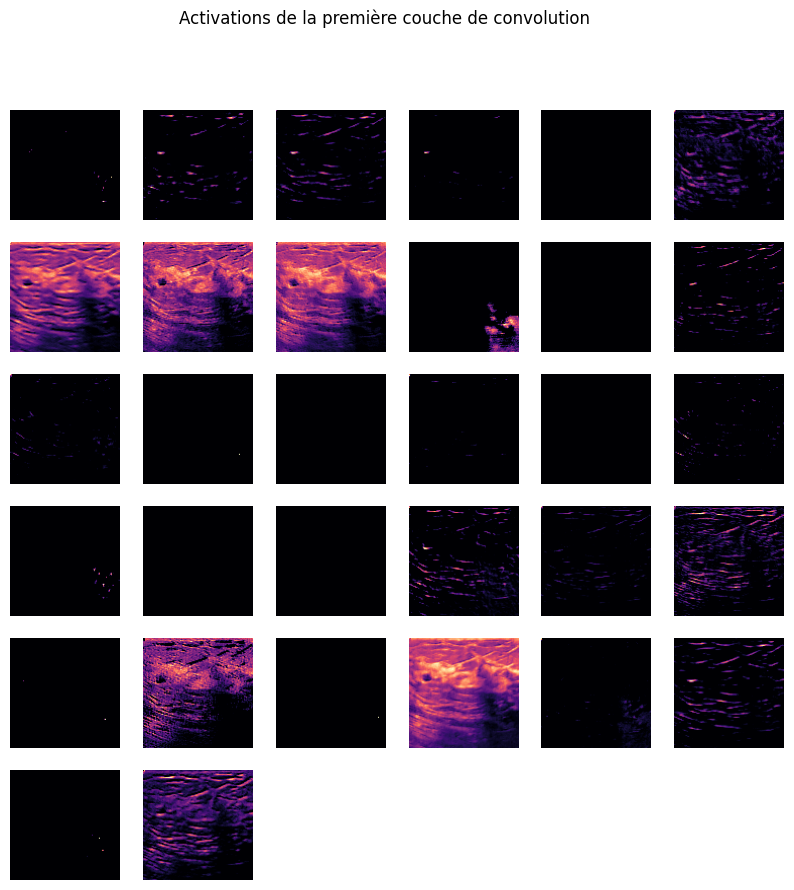

Forme des activations de la première couche de pooling: (1, 111, 111, 32)


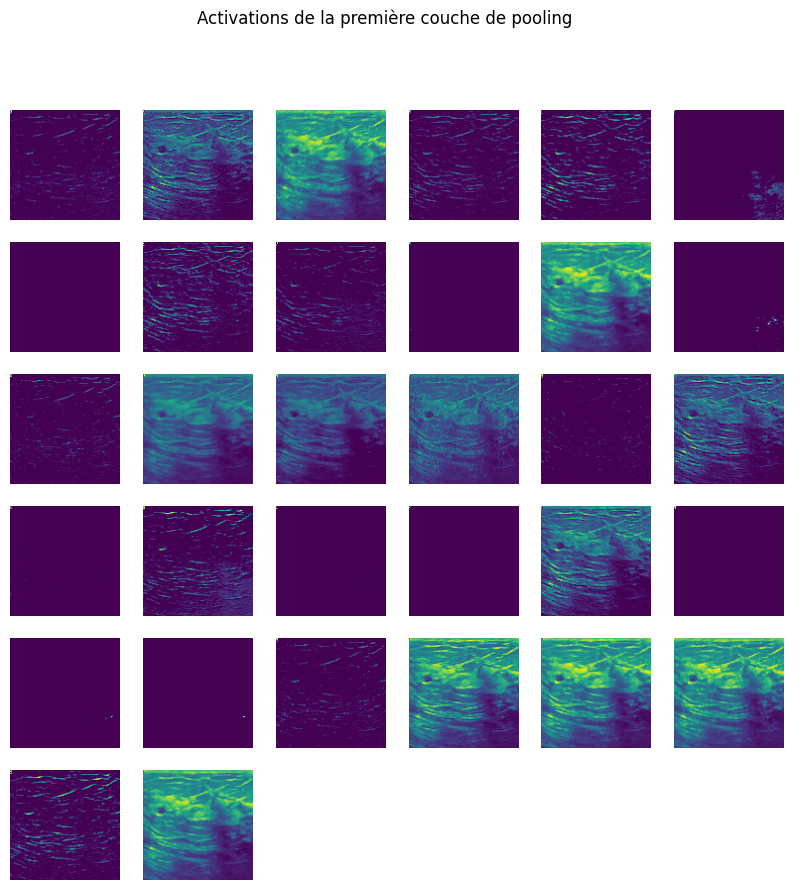

In [53]:
# ### 2. Visualiser les couches du modèle et comprendre leur rôle

# **Quoi ?**  Visualiser les activations des couches intermédiaires du CNN (convolution, pooling).
# **Pourquoi ?**  Comprendre quelles caractéristiques le modèle apprend à détecter à chaque étape.
# **Comment ?**  Créer un modèle intermédiaire qui prend l'entrée originale et renvoie les sorties des couches souhaitées.
print("\nExercice 2 : Visualiser les couches du modèle")

# On prend une image du dataset de validation (pas d'augmentation ici)
sample_image, _ = next(iter(val_ds))
sample_image = sample_image[0:1] # On garde une seule image

# On crée un modèle qui prendra l'entrée originale et renverra les sorties de *toutes* les couches.
layer_outputs = [layer.output for layer in model.layers] # Liste des sorties de chaque couche
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer_outputs)

# On fait passer l'image dans ce modèle pour obtenir les activations.
activations = activation_model.predict(sample_image)

# Affichons les activations de la première couche de convolution.
first_layer_activation = activations[2]
print(f"Forme des activations de la première couche : {first_layer_activation.shape}")  # (1, 222, 222, 32)

# On affiche les 32 cartes d'activation de cette couche.
plt.figure(figsize=(10, 10))
for i in range(32):
    ax = plt.subplot(6, 6, i + 1)  # On utilise une grille de 6x6 (pour 32 cartes + quelques espaces)
    plt.imshow(first_layer_activation[0, :, :, i], cmap='viridis')  # 'viridis' est une colormap agréable
    plt.axis('off')
plt.suptitle("Activations de la première couche de convolution")  # Titre général
plt.show()

# Visualisation des activations d'une couche de pooling (par exemple, la première)
pooling_layer_activation = activations[1]  # La première couche de pooling est à l'index 1
print(f"Forme des activations de la première couche de pooling: {pooling_layer_activation.shape}")

plt.figure(figsize=(10, 10))
for i in range(32):  # Afficher les 32 canaux (si la couche a 32 filtres, sinon ajuster)
    ax = plt.subplot(6, 6, i + 1)
    plt.imshow(pooling_layer_activation[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.suptitle("Activations de la première couche de pooling")
plt.show()

# On peut faire de même pour les autres couches (deuxième convolution, pooling, etc.).
#  Il suffit de changer l'indice dans `activations[indice]`.

# Interpretation :
#   - Les premières couches de convolution détectent des caractéristiques de bas niveau
#     (bords, coins, textures simples).
#   - Les couches suivantes combinent ces caractéristiques pour détecter des motifs plus complexes.
#   - Les couches de pooling réduisent la résolution spatiale, rendant le modèle plus
#     invariant aux petites translations.



## Exercices :

### 1. Visualiser d'autres couches

- Modifier l'indice dans activations[indice] pour afficher les activations des autres couches de convolution et de pooling.
- Observer comment la taille des activations change.
- Essayer d'identifier des motifs dans les activations.

### 2. Changer l'image d'entrée :

- Remplacer sample_image par d'autres images du dataset de validation.
- Observer comment les activations changent.
- Essayer de trouver des images qui produisent des activations particulièrement fortes ou faibles dans certaines couches.

### 3. Expérimenter avec les colormaps :

- Changer cmap='viridis' par d'autre arguments (gray, magma, etc.)

### 4. Ajouter une fonction pour afficher la couche et l'image originale cote a cote (Optionnel)


Exercice 3 : Afficher des images avec leurs prédictions


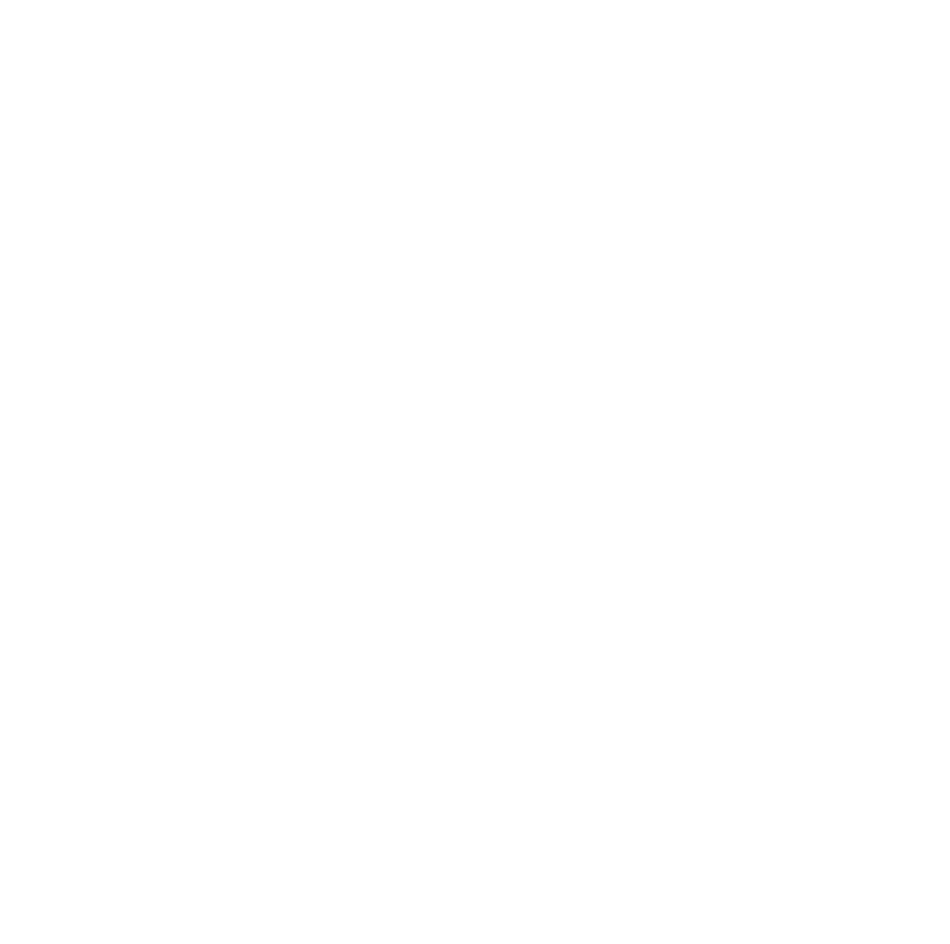

In [62]:
### 3. Afficher des images avec leurs prédictions et niveaux de confiance du modèle

# **Quoi ?**  Visualiser les images et afficher la prédiction du modèle (bénin/malin) ainsi que son niveau de confiance.
# **Pourquoi ?** Avoir un aperçu visuel de la performance du modèle et identifier les cas où il est très confiant ou incertain.
# **Comment ?**  Utiliser `model.predict()` pour obtenir les prédictions, puis les afficher avec matplotlib.
print("\nExercice 3 : Afficher des images avec leurs prédictions")
plt.figure(figsize=(12, 12))  # Agrandit la figure pour afficher plus d'images
# # val_ds: On utilise le dataset de validation (important : on n'évalue pas sur les données d'entraînement)
for images, labels in val_ds.take(1):  # Prend un batch d'images de validation
#     predictions = # TODO : Obtient les prédictions pour ce batch - predictions contiendra un tableau de probabilités (une par image du batch)
#     for i in range(16):  # Afficher 16 images
#         ax = plt.subplot(4, 4, i + 1) # Grille de 4x4
#         plt.imshow(images[i].numpy(), cmap='gray') # Affiche l'image en niveaux de gris

#         predicted_label = # TODO : Malin si la prediction est supérieure à 0.5, Bénin autrement -
#         true_label = # TODO : même principe avec le vrai label de l'image pour comparer

#         confidence = predictions[i][0] if predicted_label == "Malin" else 1 - predictions[i][0]
#         confidence_percent = # TODO Si la prédiction est "Malin", la confiance est directement la probabilité prédite.
#         # Si la prédiction est "Bénin", la confiance est 1 - probabilité, car la probabilité est celle d'être "Malin".

#         # --- POUR ALLER PLUS LOIN - AJOUTEZ VOTRE CODE ICI ---
#         # 1. Changer le seuil de classification : Que se passe-t-il si on augmente le seuil ? Si on le diminue ?
#         # 2. Afficher les images seulement si le modèle est moins confiant
#         # 3. Trier les images par ordre de confiance
#         # 4. Changer la colormap
#         # 5. Changer le take pour visualiser d'autres batchs

#         title_color = # TODO : Code couleur pour visualiser rapidement les couleurs - Vert si correct, rouge sinon
#         plt.title(f"Prédiction: {predicted_label}\nRéel: {true_label}\nConfiance: {confidence_percent:.2f}%", color=title_color)
        plt.axis('off')
plt.show()

In [58]:
# ### 4. Vérifier si le modèle a tendance à faire plus d'erreurs sur certains types d'images

# **Quoi ?**  Analyser les erreurs du modèle en fonction des caractéristiques des images (floues, contrastées, etc.).
# **Pourquoi ?** Identifier les faiblesses du modèle et orienter les efforts d'amélioration (collecte de données, prétraitement, architecture).
# **Comment ?**
#     1.  Calculer des métriques (flou, contraste) sur les images.
#     2.  Regrouper les images en fonction de ces métriques.
#     3.  Comparer le taux d'erreur du modèle dans chaque groupe.

print("\nExercice 4 : Analyse des erreurs en fonction des caractéristiques des images")

def calculate_blur(image):
    """Calcule une mesure du flou d'une image (variance du Laplacien)."""
    # S'assurer que l'image est en niveaux de gris et en uint8
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)
    if len(image.shape) > 2 and image.shape[-1] == 1:
        image = image.squeeze(-1)

    # Le Laplacien est un opérateur qui détecte les contours.
    # Si l'image est nette, les contours sont bien définis, et la variance du Laplacien est élevée.
    # Si l'image est floue, les contours sont diffus, et la variance est faibl
    return cv2.Laplacian(image, cv2.CV_64F).var()


def calculate_contrast(image):
  """Calcule le contraste d'une image (écart-type des intensités)."""
  # L'écart-type mesure la dispersion des valeurs de pixels autour de la moyenne. Un écart-type élevé signifie un contraste élevé
  return np.std(image)

# Listes pour stocker les résultats
blur_values = []
contrast_values = []
predictions_list = []
true_labels_list = []

# On itère sur l'ensemble de validation
for images, labels in val_ds:
    predictions = model.predict(images)
    for i in range(images.shape[0]):  # Pour chaque image du batch
        blur = calculate_blur(images[i].numpy()) # On calcule le flou
        contrast = calculate_contrast(images[i].numpy()) # On calcule le contraste

        blur_values.append(blur)
        contrast_values.append(contrast)
        predictions_list.append(predictions[i][0])
        true_labels_list.append(labels[i].numpy())
# Convertir en tableaux NumPy pour faciliter les calculs
blur_values = np.array(blur_values)
contrast_values = np.array(contrast_values)
predictions_list = np.array(predictions_list)
true_labels_list = np.array(true_labels_list)

# --- MODIFIEZ LE CODE CI-DESSOUS ---

# 1. Changer les seuils pour le flou et le contraste
# Définir des seuils pour le flou et le contraste (à ajuster)
blur_threshold_low = 500  # Images considérées comme floues en dessous de ce seuil
blur_threshold_high = 2000 # Images considérées comme nettes au dessus de ce seuil.
contrast_threshold_low = 0.1 # Images peu contrastées
contrast_threshold_high = 0.25 # Image très contrastées

# 2. (Optionnel) Ajouter une fonction calculate_brightness et une nouvelle métrique (luminosité)

# --- FIN DES MODIFICATIONS ---

# Fonction pour calculer le taux d'erreur
# Nombre de prédictions incorrectes divisé par le nombre total d'images
def error_rate(predictions, true_labels):
  predicted_classes = (predictions > 0.5).astype(int)
  incorrect_predictions = np.sum(predicted_classes != true_labels)
  return incorrect_predictions / len(true_labels)


# Analyser les erreurs en fonction du flou
blur_low_indices = blur_values < blur_threshold_low
blur_high_indices = blur_values > blur_threshold_high
blur_mid_indices = (blur_values >= blur_threshold_low) & (blur_values <= blur_threshold_high) # On crée des catégories pour plus de lisibilité.

error_rate_blur_low = error_rate(predictions_list[blur_low_indices], true_labels_list[blur_low_indices])
error_rate_blur_mid = error_rate(predictions_list[blur_mid_indices], true_labels_list[blur_mid_indices])
error_rate_blur_high = error_rate(predictions_list[blur_high_indices], true_labels_list[blur_high_indices])

print(f"Taux d'erreur (flou faible): {error_rate_blur_low:.4f}")
print(f"Taux d'erreur (flou moyen): {error_rate_blur_mid:.4f}")
print(f"Taux d'erreur (flou élevé/net): {error_rate_blur_high:.4f}")

# Analyser les erreurs en fonction du contraste
contrast_low_indices = contrast_values < contrast_threshold_low
contrast_high_indices = contrast_values > contrast_threshold_high
contrast_mid_indices = (contrast_values >= contrast_threshold_low) & (contrast_values <= contrast_threshold_high)


error_rate_contrast_low = error_rate(predictions_list[contrast_low_indices], true_labels_list[contrast_low_indices])
error_rate_contrast_mid = error_rate(predictions_list[contrast_mid_indices], true_labels_list[contrast_mid_indices])
error_rate_contrast_high = error_rate(predictions_list[contrast_high_indices], true_labels_list[contrast_high_indices])


print(f"Taux d'erreur (contraste faible): {error_rate_contrast_low:.4f}")
print(f"Taux d'erreur (contraste moyen): {error_rate_contrast_mid:.4f}")
print(f"Taux d'erreur (contraste élevé): {error_rate_contrast_high:.4f}")

# Interprétation : Si le taux d'erreur est significativement plus élevé pour une catégorie
# (par exemple, images floues), cela indique que le modèle a des difficultés avec ce type d'images.

# --- AJOUTEZ VOTRE CODE ICI (Visualisation) ---

# 3. Visualiser les images de chaque catégorie (flou faible, flou élevé, contraste faible, etc.)
# Utilisez plt.figure, plt.subplot, plt.imshow, et plt.title, comme dans l'exercice 3.
# Utilisez np.where pour trouver les indices des images correspondant à chaque critère.



Exercice 4 : Analyse des erreurs en fonction des caractéristiques des images
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step
Taux d'erreur (flou faible): 0.1600
Taux d'erreur (flou moyen): 0.2137
Taux d'erreur (flou élevé/net): nan
Taux d'erreur (contraste faible): nan
Taux d'erreur (contraste moyen): 0.1972
Taux d'erreur (contraste élevé): 0.2857


<ipython-input-58-03d697fdc22d>:72: RuntimeWarning: invalid value encountered in scalar divide
  return incorrect_predictions / len(true_labels)



Exercice 5 : Trouver des exemples où le modèle s'est trompé et expliquer


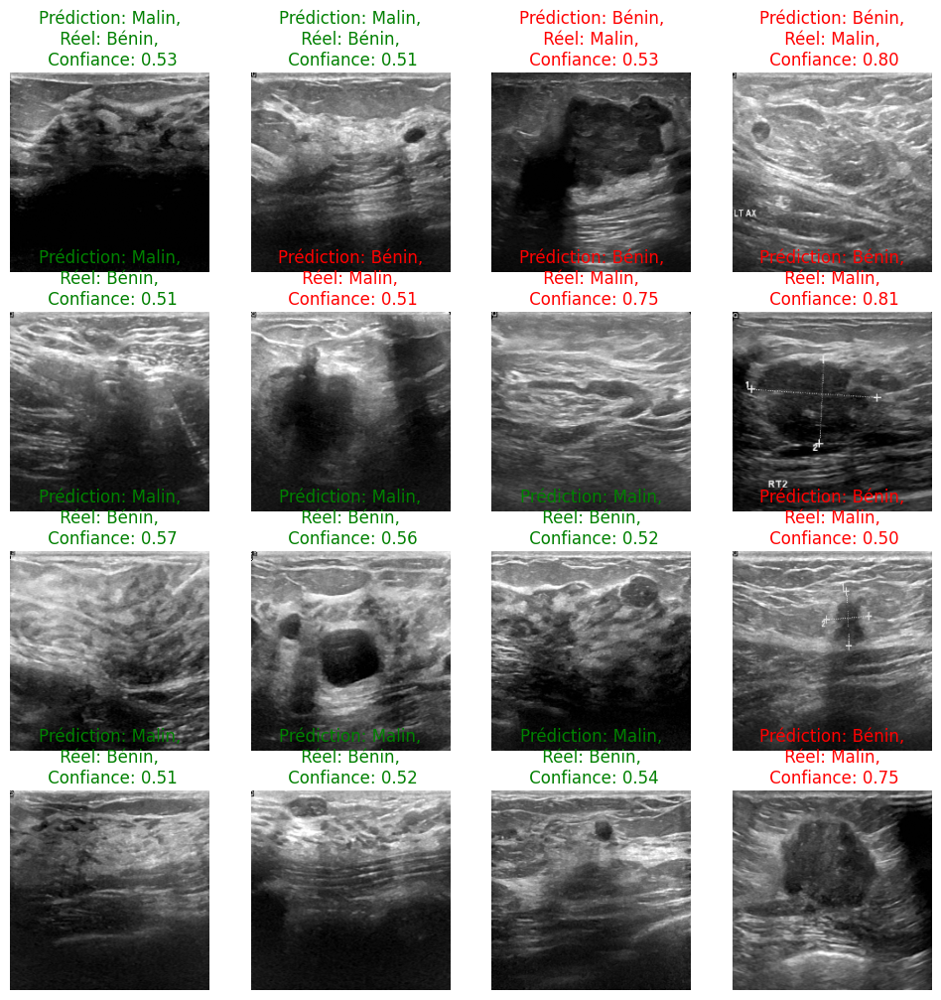

In [60]:
# ### 5. Trouver des exemples où le modèle s'est trompé et essayer d'expliquer pourquoi.

# **Quoi ?**  Identifier manuellement des cas d'erreur et chercher des explications (caractéristiques de l'image, biais du dataset, etc.).
# **Pourquoi ?**  Comprendre les limitations du modèle et avoir des pistes d'amélioration concrètes.
# **Comment ?**  Filtrer les prédictions pour ne garder que les erreurs, puis afficher les images correspondantes.
print("\nExercice 5 : Trouver des exemples où le modèle s'est trompé et expliquer")

# On réutilise les prédictions et les vrais labels de l'exercice précédent.

predicted_classes = (predictions_list > 0.5).astype(int)  # Convertit les probabilités en classes (0 ou 1)
incorrect_indices = np.where(predicted_classes != true_labels_list)[0] # Indices où le modèle s'est trompé


# Afficher quelques exemples d'erreurs
plt.figure(figsize=(12, 12))
num_errors_to_show = min(16, len(incorrect_indices)) # Pour ne pas essayer d'en afficher plus qu'il n'y en a

for i in range(num_errors_to_show):
    index = incorrect_indices[i]
    image = val_ds.unbatch().skip(index).take(1) # On prend l'image qui a mené à l'erreur dans le dataset

    for img, label in image : # Il n'y a qu'un element dans le dataset 'image'
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(img.numpy(), cmap='gray') # On affiche cette image

        predicted_label = "Malin" if predictions_list[index] > 0.5 else "Bénin"
        true_label = "Malin" if true_labels_list[index] == 1 else "Bénin"
        confidence = predictions_list[index] if predicted_label == "Malin" else 1 - predictions_list[index]

        title_color = "green" if true_label == "Bénin" else "red"  # Vert si correct, rouge sinon
        plt.title(f"Prédiction: {predicted_label},\n Réel: {true_label}, \n Confiance: {confidence:.2f}", color=title_color)
        plt.axis('off')

plt.show()


# Exemples d'explications possibles (à vérifier au cas par cas) :
#    - Image très floue ou bruitée.
#    - Faible contraste entre la lésion et les tissus environnants.
#    - Lésion de petite taille ou de forme inhabituelle.
#    - Présence d'artefacts dans l'image.
#    - Biais du dataset (par exemple, surreprésentation de certains types de lésions).


# Exercice d'analsyse :

Il y a deux types d'erreurs possibles :

- Faux Positifs (FP): Le modèle prédit "Malin" alors que le vrai label est "Bénin".
- Faux Négatifs (FN): Le modèle prédit "Bénin" alors que le vrai label est "Malin".

1. Observer attentivement :  Pour chaque image, examiner :

- Le flou (est-ce que l'image est nette ?)
- Le contraste (est-ce que la lésion se distingue bien des tissus environnants ?)
- La luminosité (est-ce que l'image est globalement sombre ou claire ?)
- La taille et la forme de la lésion (si visible)
- La présence éventuelle d'artefacts (éléments qui ne font pas partie de l'anatomie normale)

2. Formuler des hypothèses : Pour chaque erreur, essayer de répondre à la question : "Pourquoi le modèle s'est-il trompé sur cette image ?"

- Noter les hypothèses par écrit.
- Utiliser les connaissances acquises dans les exercices précédents (sur le flou, le contraste, etc.).

3. Regrouper les erreurs : Essayer d'identifier des types d'erreurs récurrentes. Par exemple :

- "Le modèle a du mal avec les petites lésions."
- "Le modèle se trompe souvent quand le contraste est faible."
- "Il y a un type de lésion (par exemple, calcifications) que le modèle a tendance à mal classer."

4. Relier aux métriques (optionel)

- Reprendre le code de l'exercice 4 pour afficher, en plus de l'image, les valeurs calculées pour le contraste, le flou et la luminosité, ce qui permettra aux étudiantes de valider certaines de leurs hypothèses.


# Aller plus loin:
   -  Augmenter le nombre d'epochs (avec prudence, pour éviter le surapprentissage).
   -  Essayer d'autres architectures de CNN (plus profondes, pré-entraînées...).
   -  Utiliser des techniques d'interprétabilité plus avancées (Grad-CAM, SHAP...).
   -  Collecter plus de données, en particulier des exemples qui posent problème au modèle.
   -  Consulter des experts médicaux pour valider les résultats et identifier les biais potentiels.

## Solutions


Exercice 1: Appliquer différentes transformations aux images


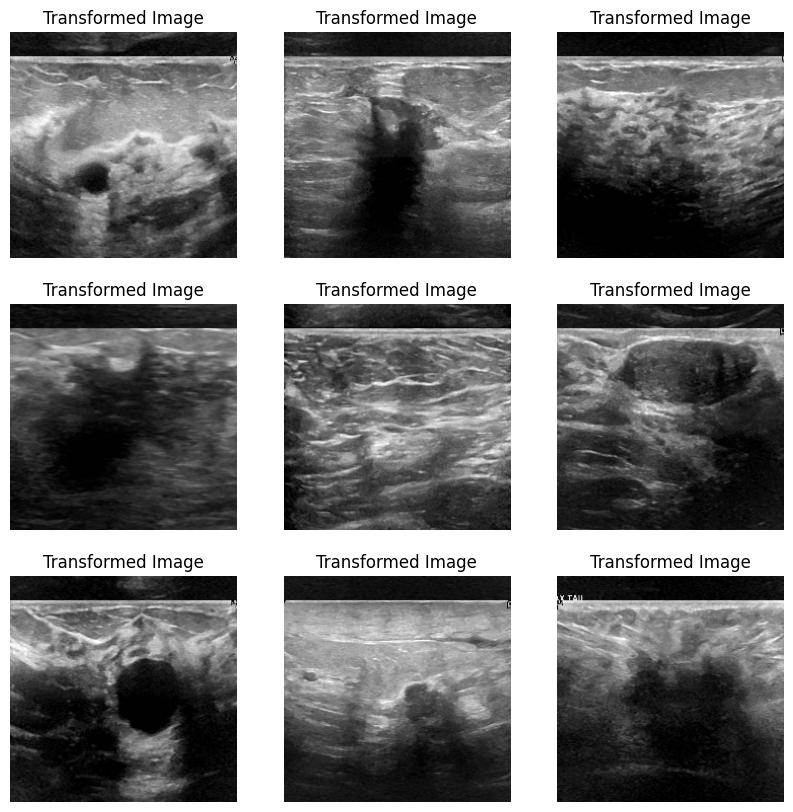

In [63]:
# ### 1. Appliquer différentes transformations aux images

# **Quoi ?**  Les transformations d'images (ou augmentation de données) sont des modifications
# aléatoires appliquées aux images pendant l'entraînement.
# **Pourquoi ?**  Cela permet d'augmenter artificiellement la taille du dataset et de rendre le
# modèle plus robuste aux variations (rotation, zoom, luminosité, etc.).
# **Comment ?**  On peut utiliser les fonctions de `tf.image` ou des librairies comme `ImageDataGenerator` de Keras.
print("\nExercice 1: Appliquer différentes transformations aux images")

def apply_random_transformations(image, label):
    """Applique des transformations aléatoires à une image."""

    # Rotation aléatoire
    if tf.random.uniform(()) > 0.5:
      image = tf.image.rot90(image, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))
    # Translation horizontale aléatoire
    if tf.random.uniform(()) > 0.5:
      image = tf.image.random_flip_left_right(image)
    # Translation verticale
    if tf.random.uniform(()) > 0.5:
        image = tf.image.random_flip_up_down(image)

    # Zoom aléatoire
    if tf.random.uniform(()) > 0.5:
      zoom = tf.random.uniform(shape=[2], minval=0.8, maxval=1.2)  # Zoom entre 0.8x et 1.2x
      new_size = [int(224 * zoom[0]), int(224 * zoom[1])]
      image = tf.image.resize(image, new_size)
      image = tf.image.resize_with_crop_or_pad(image, 224, 224)  # Recadre ou ajoute du padding

    # Modification de la luminosité
    if tf.random.uniform(()) > 0.5:
      image = tf.image.random_brightness(image, max_delta=0.2) # Variation de luminosité

    # Contraste
    if tf.random.uniform(()) > 0.5:
      image = tf.image.random_contrast(image, lower=0.7, upper=1.3)

    if tf.random.uniform(()) > 0.5:
      # Translation aléatoire : Définir une plage pour les décalages horizontaux et verticaux
      tx = tf.random.uniform(shape=(), minval=-30, maxval=30, dtype=tf.int32)  # Décalage horizontal
      ty = tf.random.uniform(shape=(), minval=-30, maxval=30, dtype=tf.int32)  # Décalage vertical

      # Appliquer la translation avec tf.roll (plus simple pour les translations)
      image = tf.roll(image, shift=[ty, tx], axis=[0, 1])

    return image, label

# On applique la fonction de transformations aléatoires aux images du dataset d'entraînement.
# On n'applique *pas* de transformations au dataset de validation.
transformed_train_ds = train_ds.map(apply_random_transformations)

# Visualisons quelques images transformées
plt.figure(figsize=(10, 10))
for images, labels in transformed_train_ds.take(1):  # Prend un batch d'images
    for i in range(9):  # Affiche 9 images
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy(), cmap="gray")
        plt.title("Transformed Image")
        plt.axis("off")
plt.show()



Exercice 2 : Visualiser les couches du modèle
Forme des activations de la première couche : (1, 222, 222, 32)


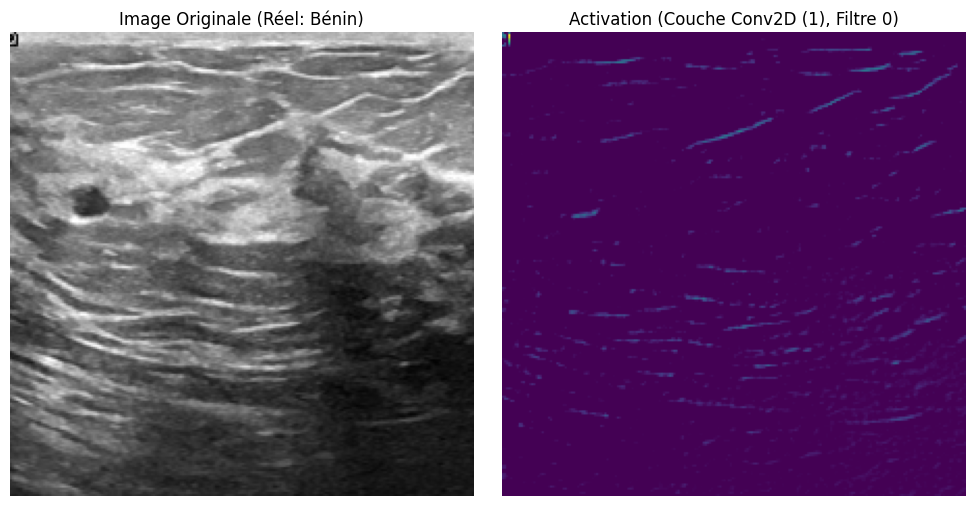

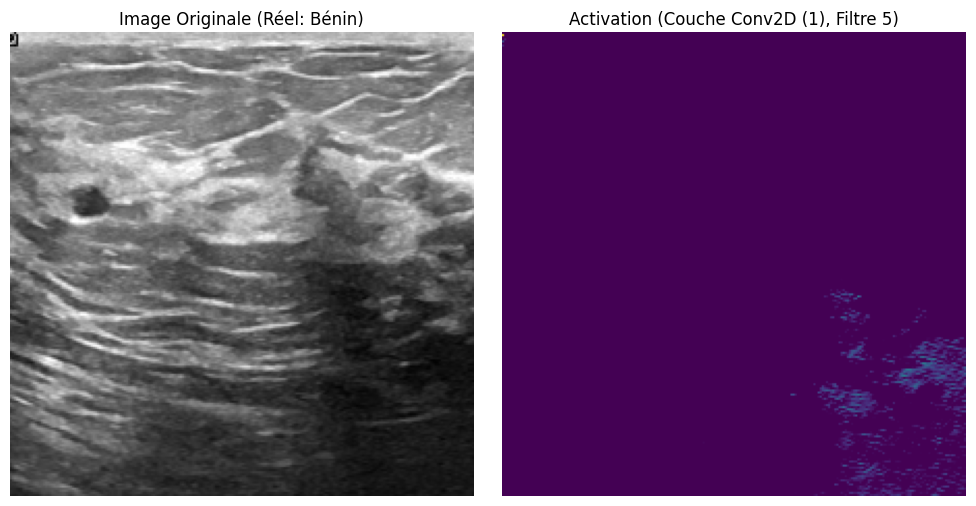

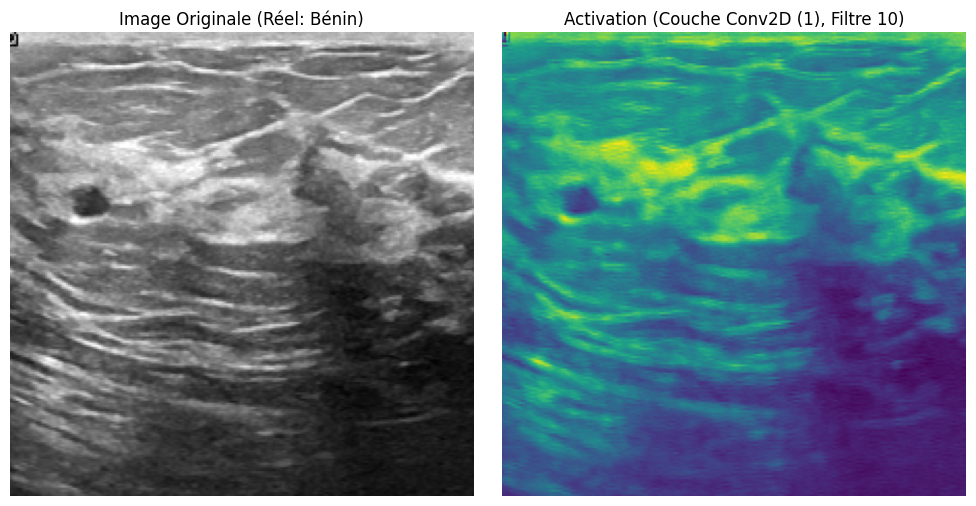

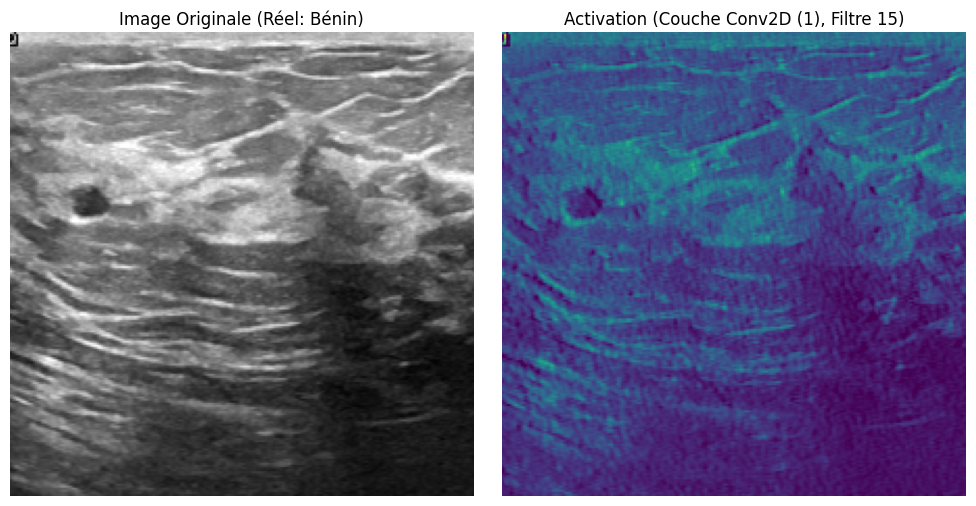

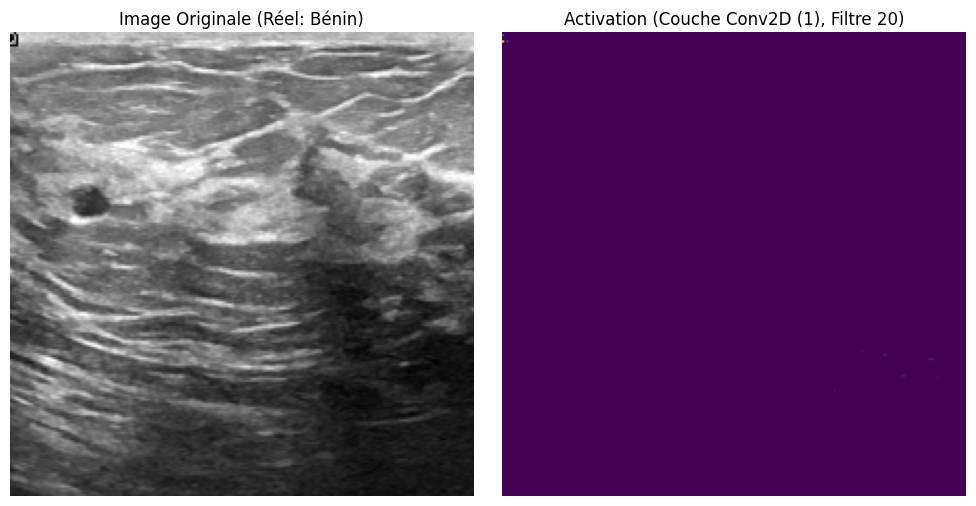

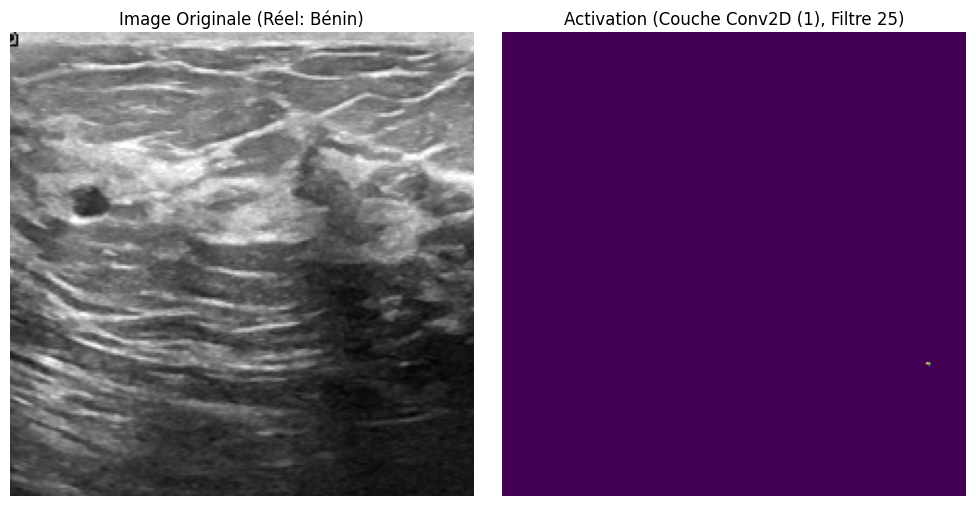

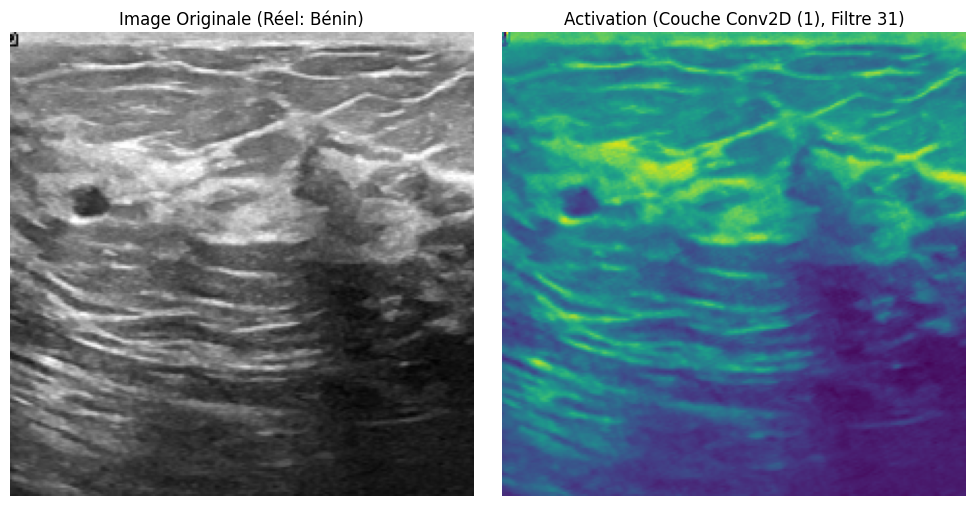

Forme des activations de la première couche de pooling: (1, 111, 111, 32)


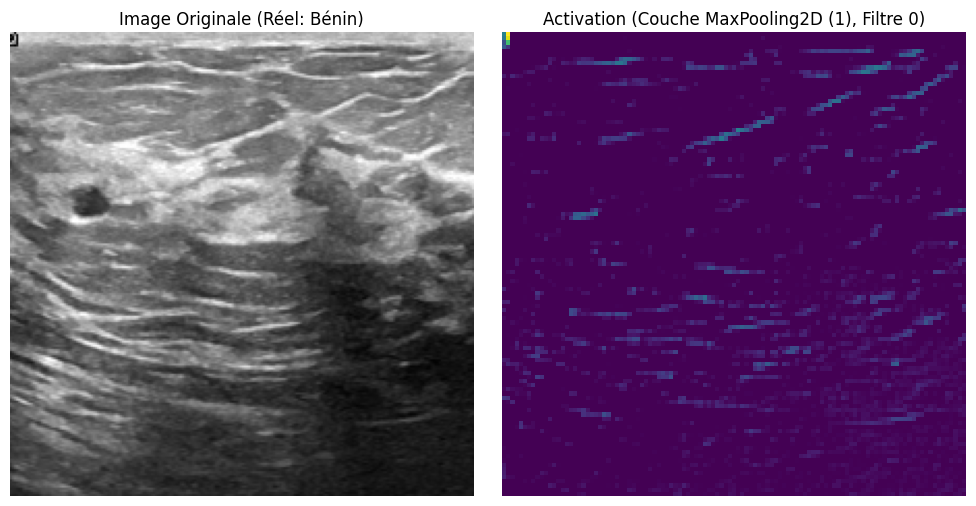

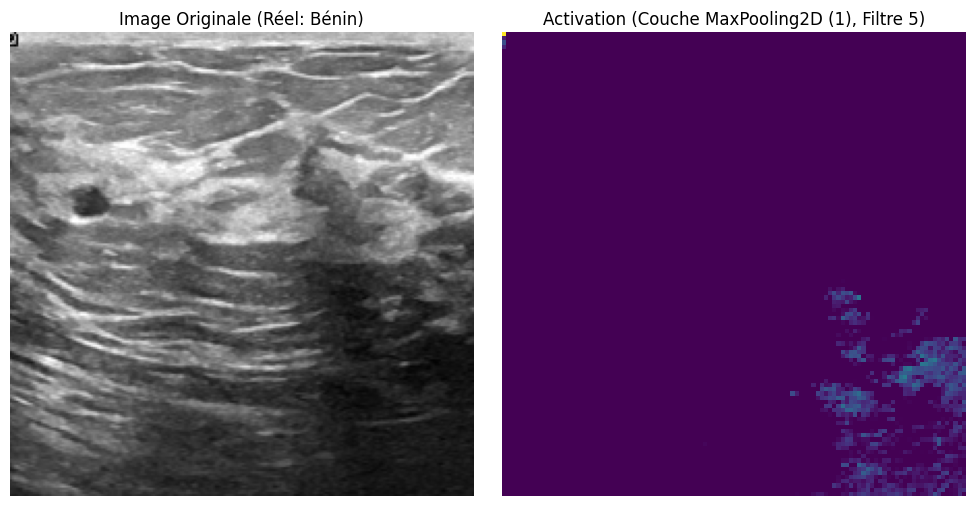

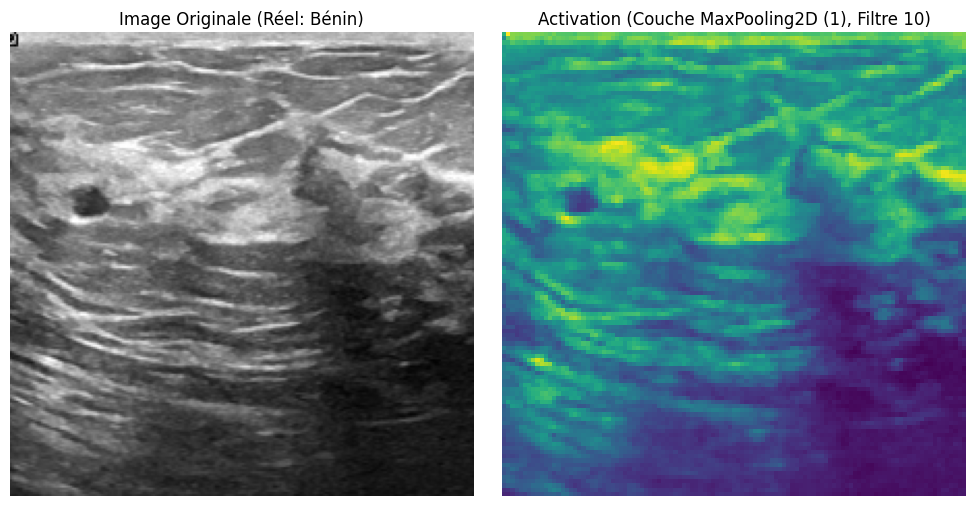

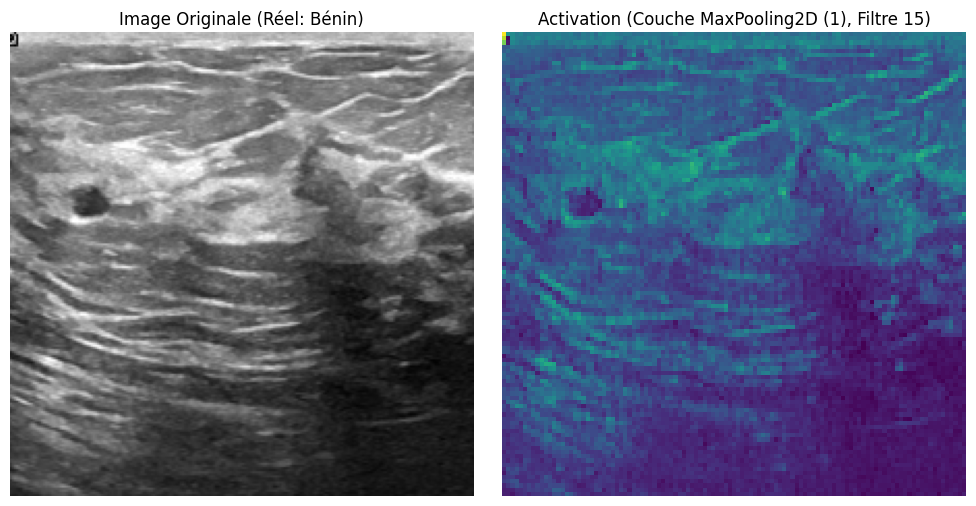

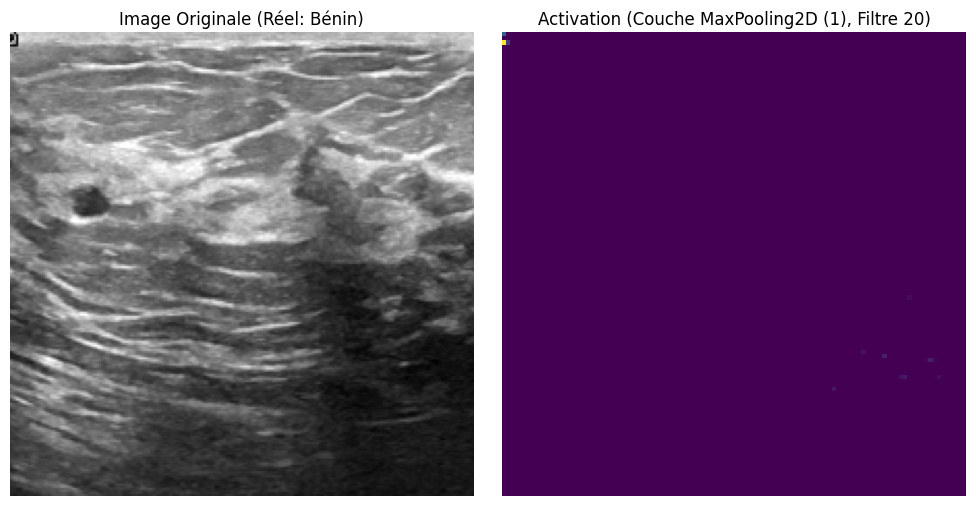

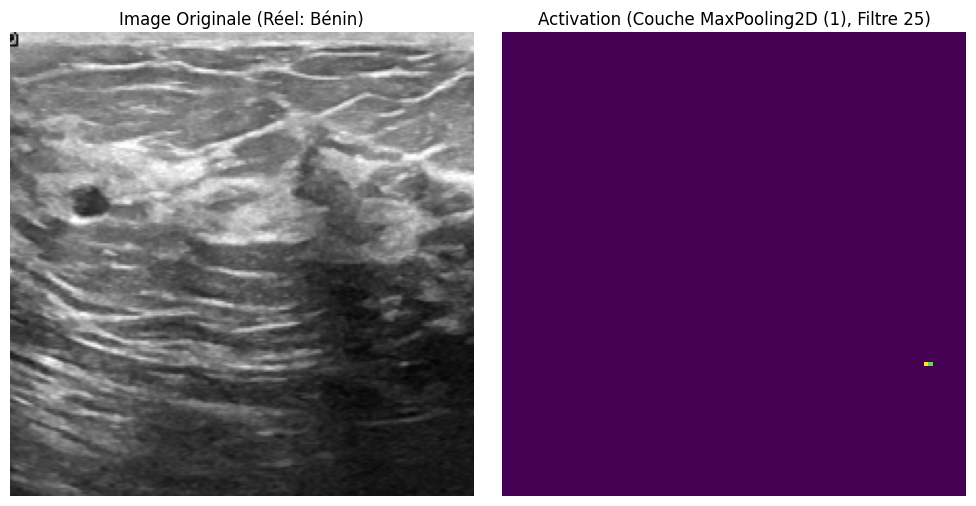

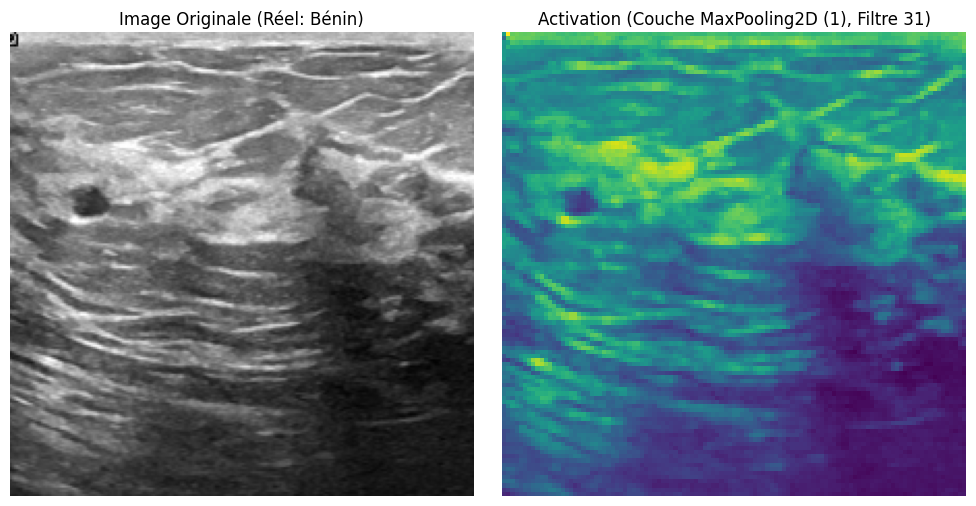

Forme des activations de la troisième couche de convolution: (1, 52, 52, 128)


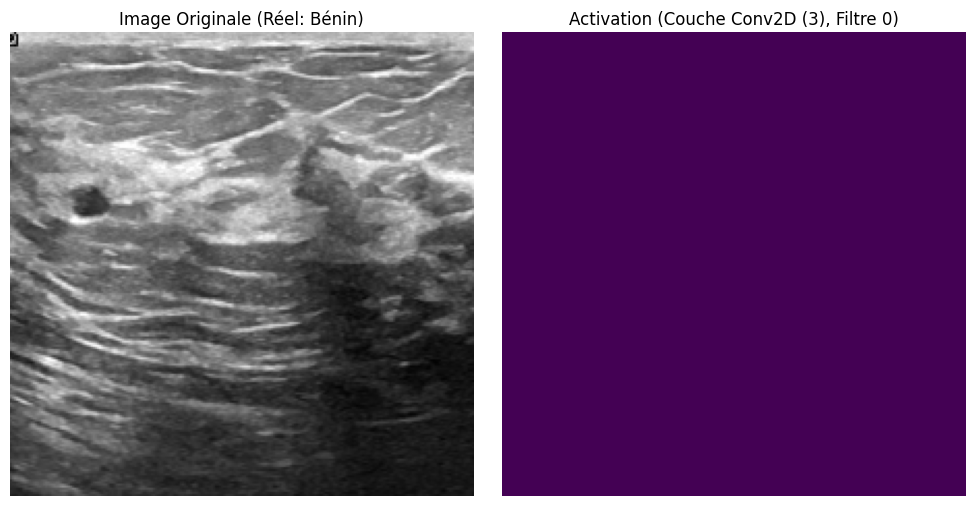

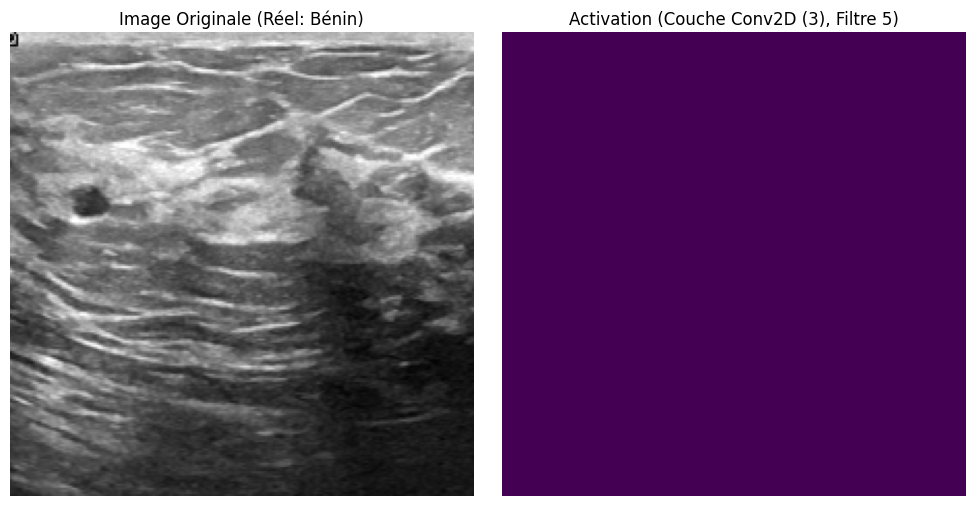

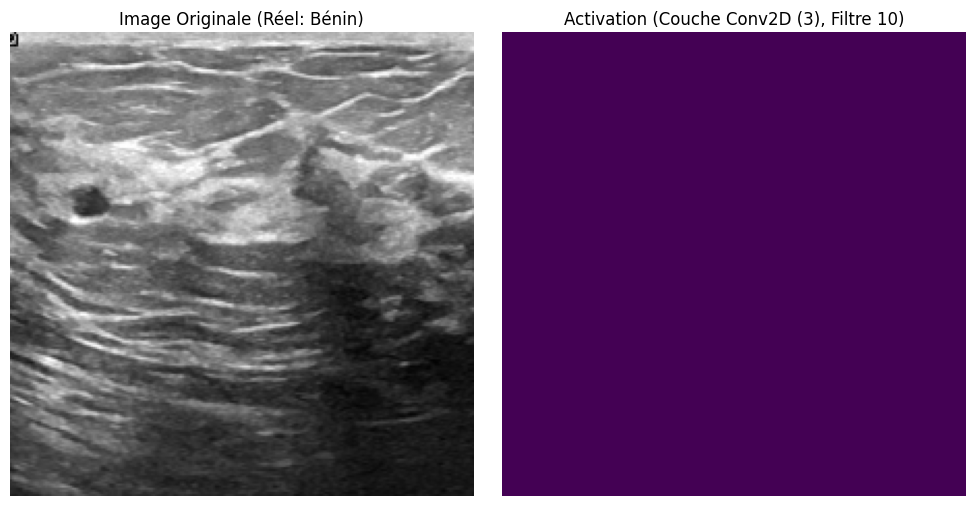

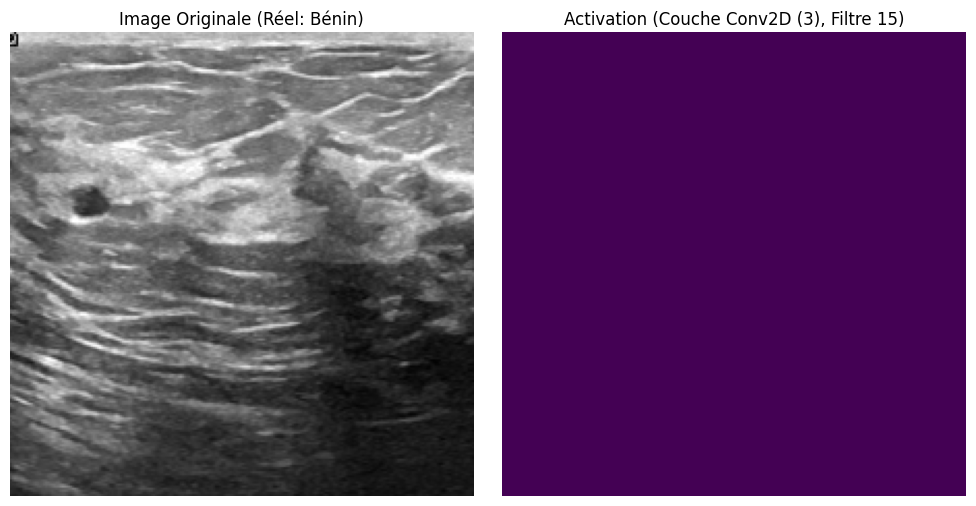

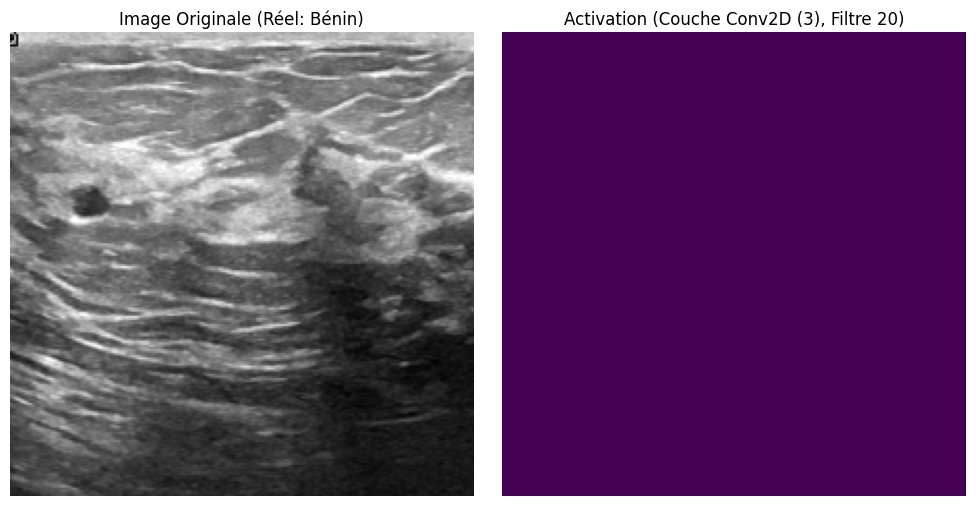

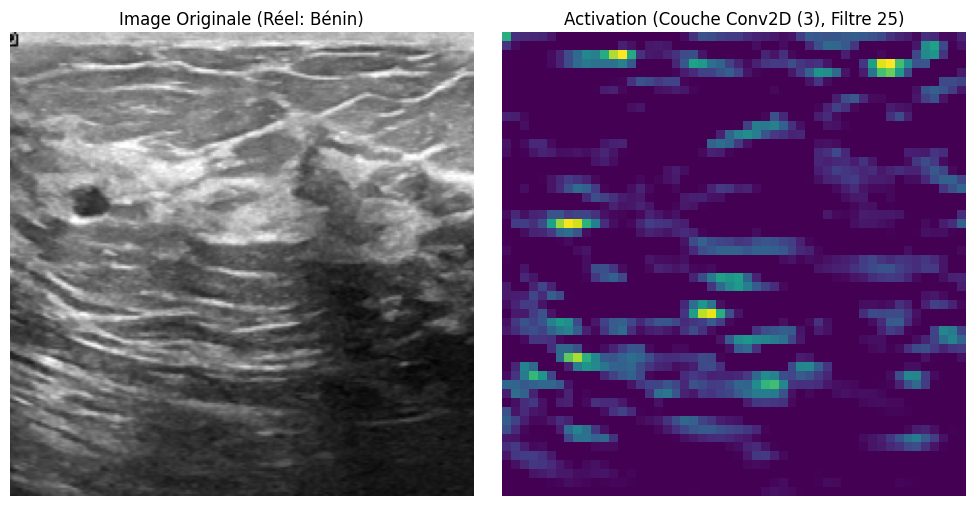

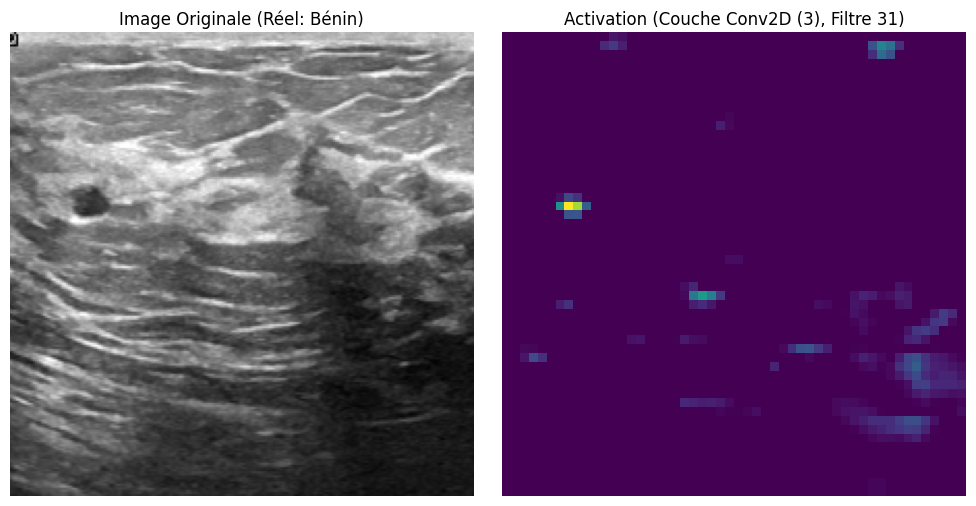

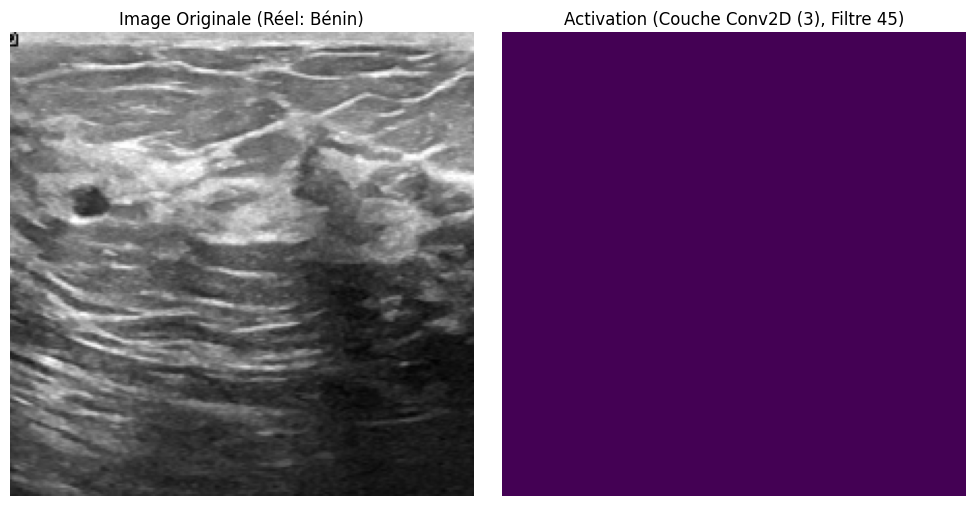

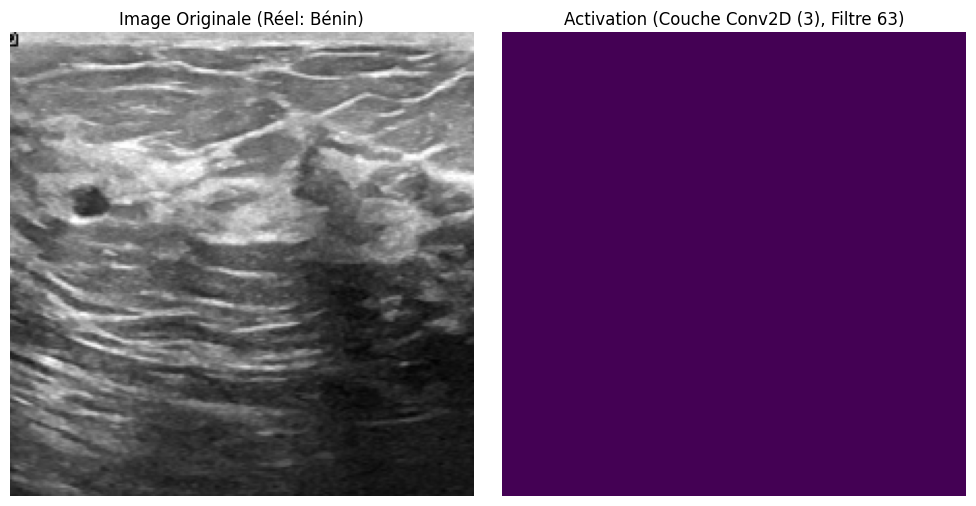

In [64]:
# ### 2. Visualiser les couches du modèle et comprendre leur rôle

# **Quoi ?**  Visualiser les activations des couches intermédiaires du CNN (convolution, pooling).
# **Pourquoi ?**  Comprendre quelles caractéristiques le modèle apprend à détecter à chaque étape.
# **Comment ?**  Créer un modèle intermédiaire qui prend l'entrée originale et renvoie les sorties des couches souhaitées.
print("\nExercice 2 : Visualiser les couches du modèle")

# On prend une image du dataset de validation (pas d'augmentation ici)
sample_image, sample_label = next(iter(val_ds))  # On prend aussi le label maintenant
sample_image = sample_image[0:1] # On garde une seule image
sample_label = sample_label[0:1] # On garde le label correspondant


# On crée un modèle qui prendra l'entrée originale et renverra les sorties des *toutes* les couches.
layer_outputs = [layer.output for layer in model.layers]
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer_outputs)

# On fait passer l'image dans ce modèle pour obtenir les activations.
activations = activation_model(sample_image)

# --- Fonction pour afficher l'image originale et une activation côte à côte ---
def visualize_activation_and_image(activation, original_image, original_label, layer_name, filter_index):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(original_image[0, :, :, 0], cmap='gray')
    true_label_text = "Malin" if original_label.numpy()[0] == 1 else "Bénin"
    plt.title(f"Image Originale (Réel: {true_label_text})")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(activation[0, :, :, filter_index], cmap='viridis')
    plt.title(f"Activation (Couche {layer_name}, Filtre {filter_index})")
    plt.axis('off')

    plt.tight_layout()  # Améliore l'espacement
    plt.show()

# --- Visualisation de la première couche de convolution ---
first_layer_activation = activations[0]
print(f"Forme des activations de la première couche : {first_layer_activation.shape}")

# On affiche quelques filtres de la première couche
for i in [0, 5, 10, 15, 20, 25, 31]:  # Exemples de filtres
    visualize_activation_and_image(first_layer_activation, sample_image, sample_label, "Conv2D (1)", i)

# --- Visualisation de la première couche de pooling ---
pooling_layer_activation = activations[1]
print(f"Forme des activations de la première couche de pooling: {pooling_layer_activation.shape}")

# On affiche quelques filtres de la première couche de pooling
for i in [0, 5, 10, 15, 20, 25, 31]:
    visualize_activation_and_image(pooling_layer_activation, sample_image, sample_label, "MaxPooling2D (1)", i)

# --- Visualisation d'une couche de convolution plus profonde (par exemple, la 3ème) ---
third_layer_activation = activations[4]  # La 3ème couche de convolution est à l'index 4
print(f"Forme des activations de la troisième couche de convolution: {third_layer_activation.shape}")

# On affiche quelques filtres de la troisième couche de convolution
for i in [0, 5, 10, 15, 20, 25, 31, 45, 63]: #La troisieme couche de convolution a 64 filtres.
  visualize_activation_and_image(third_layer_activation, sample_image, sample_label,"Conv2D (3)", i)

# Analyse des Résultats et Conclusions

**1. Première Couche de Convolution (Conv2D (1)) :**

- **Forme des activations** : (1, 222, 222, 32) - 32 cartes d'activation, chacune de taille légèrement inférieure à l'image originale.
- **Interprétation** : Les filtres de la première couche détectent des caractéristiques de bas niveau :
  - **Bords** : Certains filtres réagissent fortement aux bords horizontaux, verticaux ou diagonaux.
  - **Coins** : D'autres filtres détectent des coins ou des points d'intersection.
  - **Textures simples** : On observe des motifs de type "grille" ou "rayures".
  - **Variations de luminosité** : Certains filtres s'activent dans les zones claires, d'autres dans les zones sombres.

- **Comparaison avec l'image originale** : En regardant l'image originale et les activations côte à côte, on peut voir où dans l'image chaque filtre s'active. Par exemple, un filtre qui détecte les bords horizontaux s'activera le long des lignes horizontales de l'image.

**2. Première Couche de Pooling (MaxPooling2D (1)) :**

- **Forme des activations : (1, 111, 111, 32)** - La taille spatiale a été divisée par 2.
- **Interprétation** : Le pooling conserve les activations les plus fortes de chaque petite région de l'image. Cela a deux effets :
  - **Réduction de la dimension **: L'information est condensée.
  - **Invariance aux petites translations** : Si un bord est légèrement décalé, le pooling fera en sorte que l'activation reste à peu près au même endroit.

- **Comparaison avec la couche de convolution**: Les activations de pooling sont plus "grossières" que celles de la convolution, mais elles conservent les motifs les plus importants.

**3. Troisième Couche de Convolution (Conv2D (3)) :**

- **Forme des activations** : (1, 53, 53, 64) La taille a encore diminué, et il y a maintenant 64 filtres.
- **Interprétation** : Les filtres des couches profondes détectent des caractéristiques de plus haut niveau, qui sont des combinaisons des caractéristiques de bas niveau détectées par les premières couches.
  - **Formes plus complexes** : On commence à voir des motifs plus élaborés, comme des arcs, des cercles, des textures plus complexes.
  - **Parties de lésions** : Certains filtres pourraient s'activer spécifiquement sur des parties de lésions (par exemple, les contours irréguliers d'une tumeur).
- **Abstraction** : Il devient plus difficile d'interpréter directement ce que chaque filtre représente. Les activations sont plus abstraites.

**Conclusions Générales**

Rôle de chaque couche :
- **Convolution** : Extraction de caractéristiques.
- **Pooling** : Réduction de la dimension et invariance aux petites translations.

**Interprétabilité** : Visualiser les activations est un outil précieux pour comprendre ce que le modèle apprend, mais l'interprétation devient plus difficile dans les couches profondes.

**Lien avec la performance** : Si le modèle ne fonctionne pas bien, on peut utiliser cette visualisation pour :
- Vérifier si les premières couches extraient des caractéristiques pertinentes.
- Identifier des couches qui n'apprennent rien (activations toujours nulles).
- Comparer les activations de différentes images (par exemple, une image bien classée et une image mal classée) pour voir où les différences apparaissent.

Importance du choix de l'image : \
Le choix de l'image est important. Si le modele se trompe souvent sur des images floues, il est important de visualiser les activations avec ce type d'image.

**Pour aller plus loin (au-delà de cet exercice) :**

- Grad-CAM : Une technique plus avancée qui permet de visualiser quelles parties de l'image ont le plus contribué à la décision du modèle (pour une classe donnée).
- SHAP values : Une autre approche d'interprétabilité qui quantifie l'impact de chaque pixel sur la prédiction.


Exercice 3 : Afficher des images avec leurs prédictions
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step


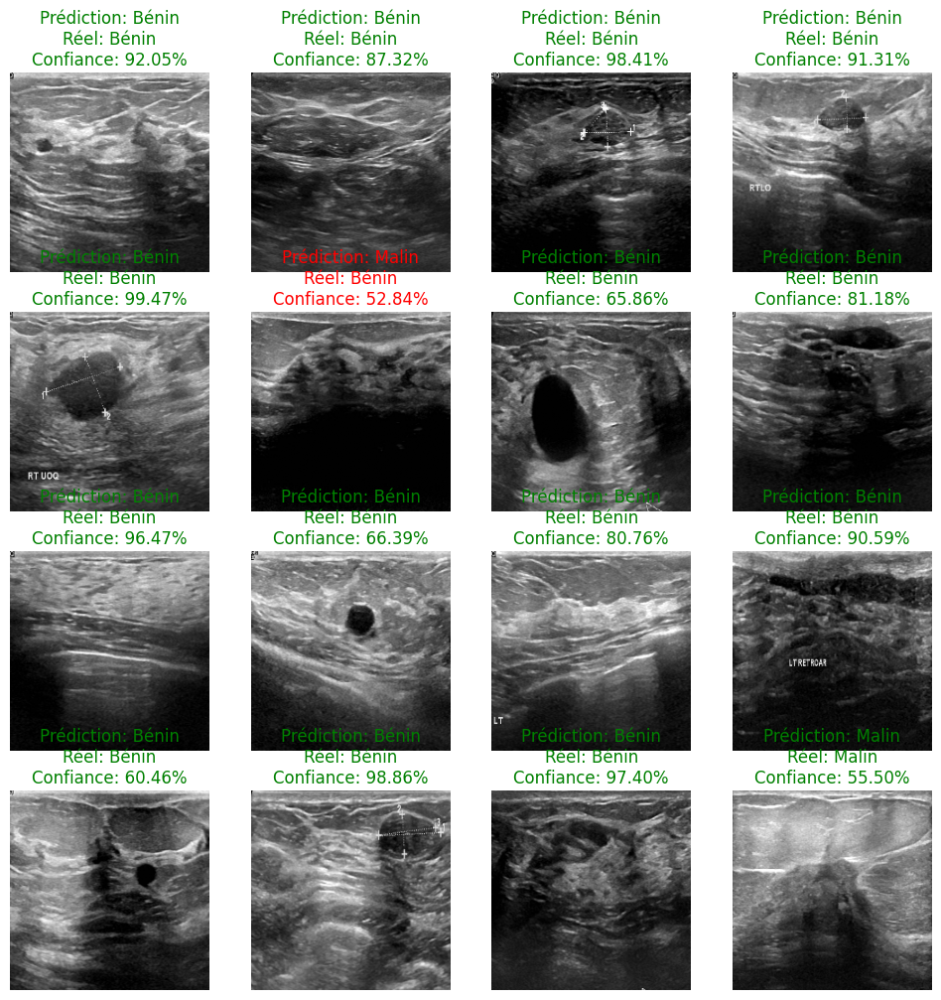

In [65]:
# ### 3. Afficher des images avec leurs prédictions et niveaux de confiance du modèle - Solution

# **Quoi ?**  Visualiser les images et afficher la prédiction du modèle (bénin/malin) ainsi que son niveau de confiance.
# **Pourquoi ?** Avoir un aperçu visuel de la performance du modèle et identifier les cas où il est très confiant ou incertain.
# **Comment ?**  Utiliser `model.predict()` pour obtenir les prédictions, puis les afficher avec matplotlib.
print("\nExercice 3 : Afficher des images avec leurs prédictions")
plt.figure(figsize=(12, 12))  # Agrandit la figure pour afficher plus d'images
# val_ds: On utilise le dataset de validation (important : on n'évalue pas sur les données d'entraînement)
for images, labels in val_ds.take(1):  # Prend un batch d'images de validation
    predictions = model.predict(images)  # Obtient les prédictions pour ce batch - predictions contiendra un tableau de probabilités (une par image du batch)
    for i in range(16):  # Afficher 16 images
        ax = plt.subplot(4, 4, i + 1) # Grille de 4x4
        plt.imshow(images[i].numpy(), cmap='gray') # Affiche l'image en niveaux de gris

        predicted_label = "Malin" if predictions[i][0] > 0.5 else "Bénin"  # Seuil à 0.5
        true_label = "Malin" if labels[i].numpy() == 1 else "Bénin" # On recupere les vrais labels pour comparer

        confidence = predictions[i][0] if predicted_label == "Malin" else 1 - predictions[i][0]
        confidence_percent = confidence * 100

        title_color = "green" if predicted_label == true_label else "red"  # Vert si correct, rouge sinon
        plt.title(f"Prédiction: {predicted_label}\nRéel: {true_label}\nConfiance: {confidence_percent:.2f}%", color=title_color)
        plt.axis('off')
plt.show()



Exercice 4 : Analyse des erreurs en fonction des caractéristiques des images
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step
Taux d'erreur (luminosité faible): 0.2857
Taux d'erreur (luminosité moyenne): 0.1972
Taux d'erreur (luminosité élevée): nan


<ipython-input-66-1051c83e9ae4>:43: RuntimeWarning: invalid value encountered in scalar divide
  return incorrect_predictions / len(true_labels)


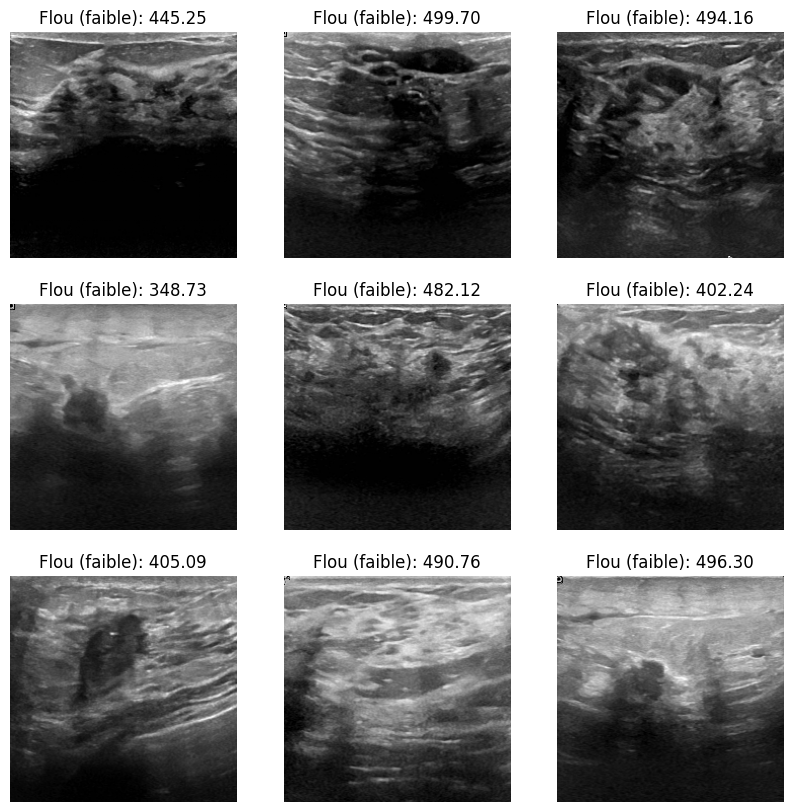

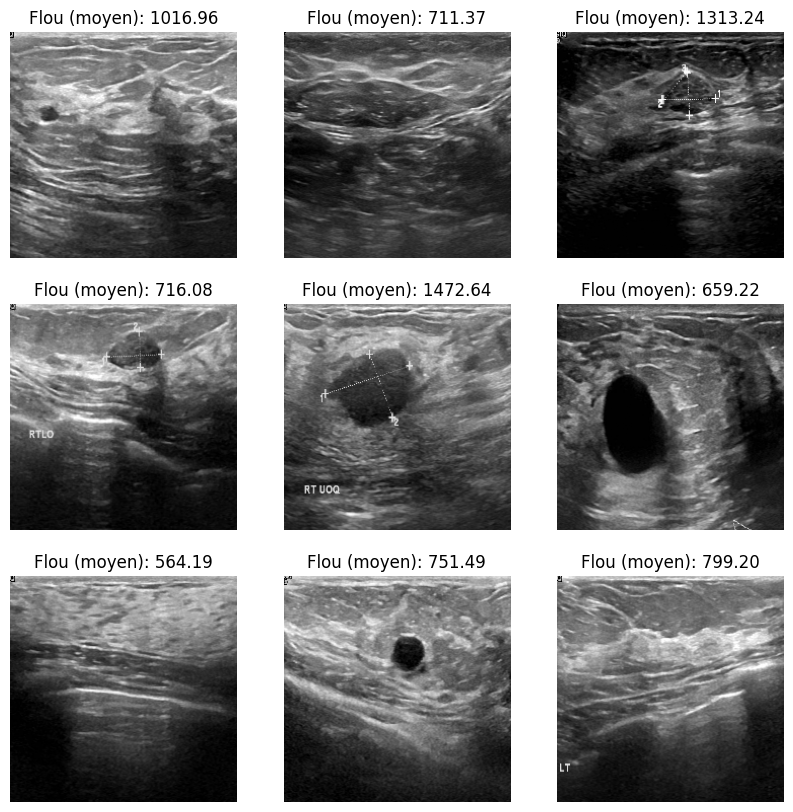

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

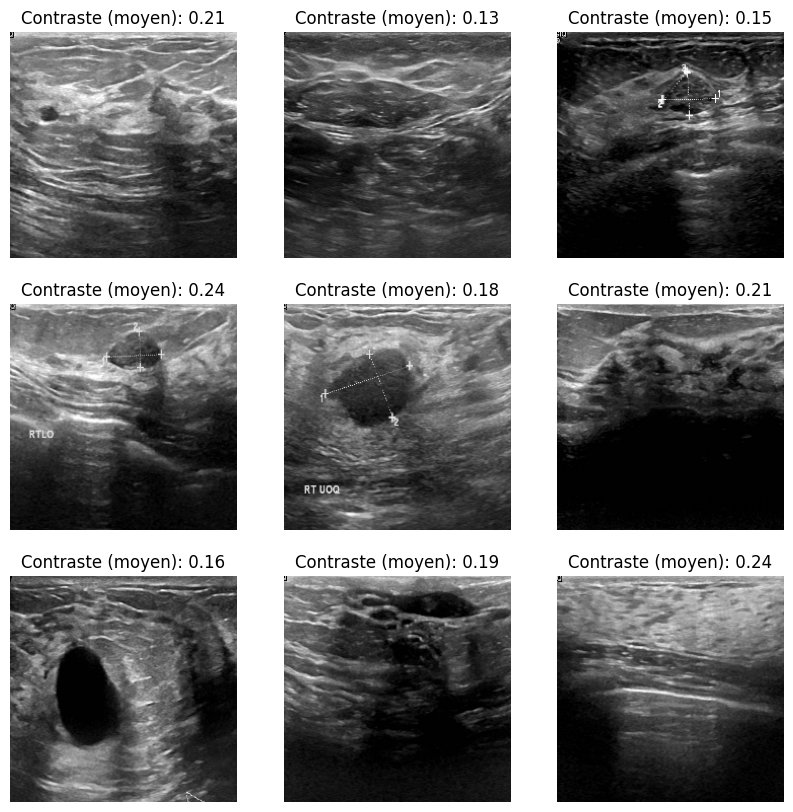

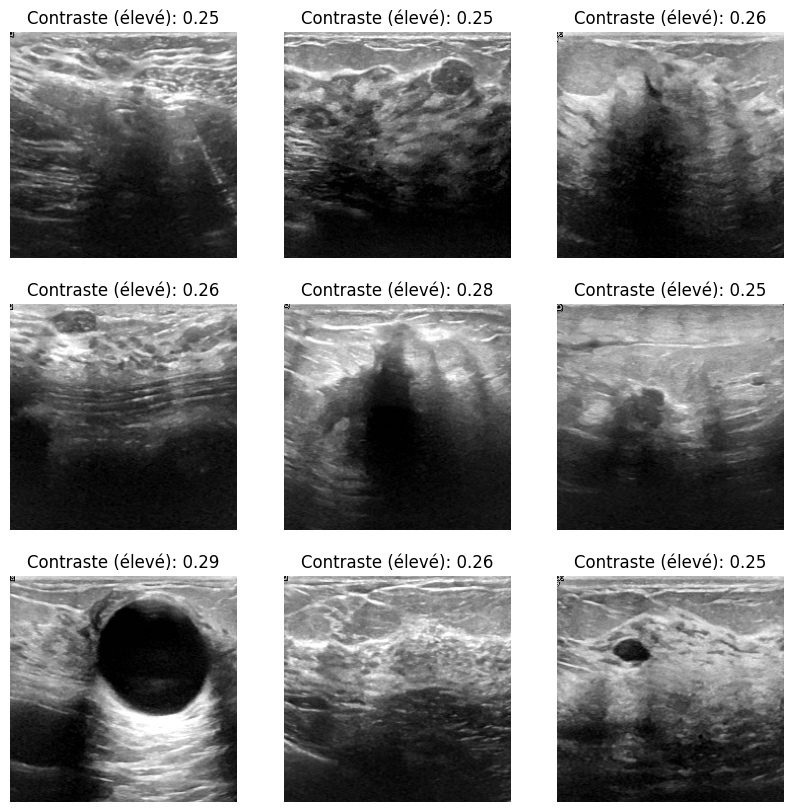

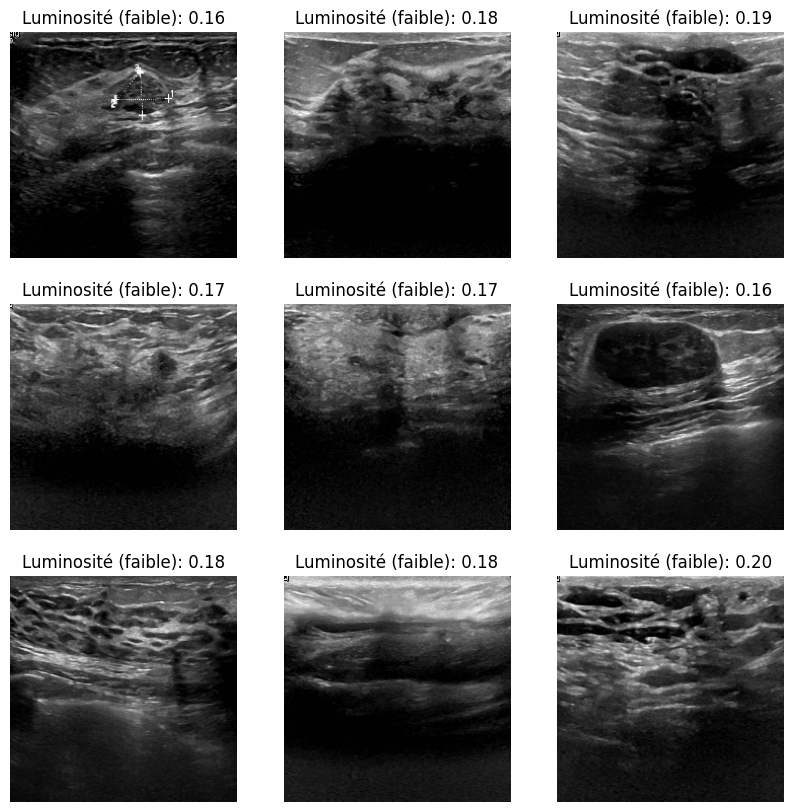

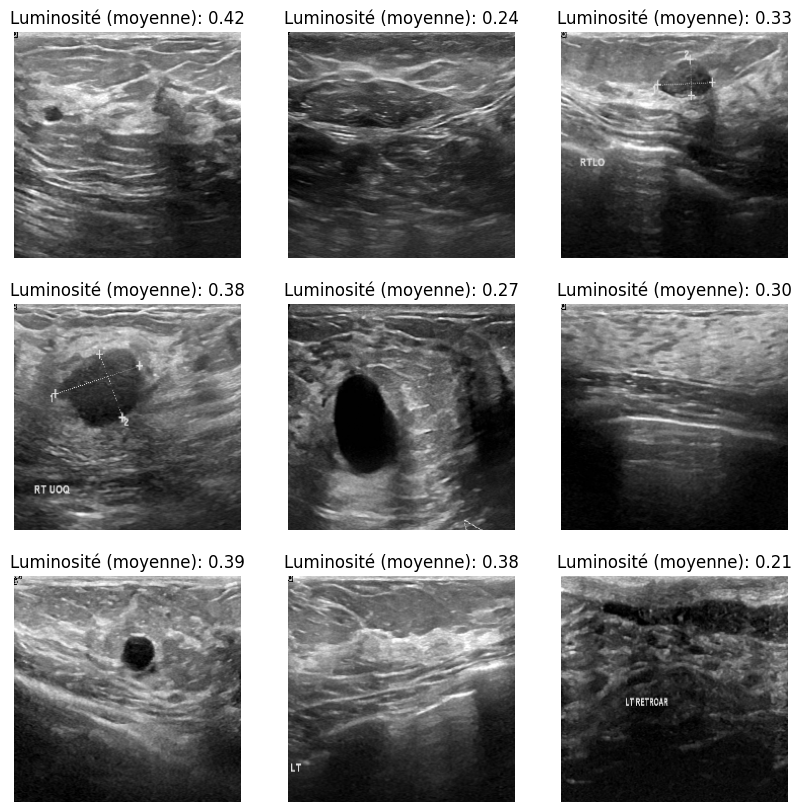

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

Taux d'erreur (flou faible ET contraste faible) : nan


In [66]:
# ### 4. Vérifier si le modèle a tendance à faire plus d'erreurs sur certains types d'images

# **Quoi ?**  Analyser les erreurs du modèle en fonction des caractéristiques des images (floues, contrastées, etc.).
# **Pourquoi ?** Identifier les faiblesses du modèle et orienter les efforts d'amélioration (collecte de données, prétraitement, architecture).
# **Comment ?**
#     1.  Calculer des métriques (flou, contraste) sur les images.
#     2.  Regrouper les images en fonction de ces métriques.
#     3.  Comparer le taux d'erreur du modèle dans chaque groupe.

print("\nExercice 4 : Analyse des erreurs en fonction des caractéristiques des images")

def calculate_brightness(image):
    """Calcule la luminosité moyenne d'une image."""
    return np.mean(image)


brightness_values = []
predictions_list = []
true_labels_list = []

# On itère sur l'ensemble de validation
for images, labels in val_ds:
    predictions = model.predict(images)
    for i in range(images.shape[0]):
        brightness = calculate_brightness(images[i].numpy())  # Calcul de la luminosité
        brightness_values.append(brightness)  # Stockage de la luminosité
        predictions_list.append(predictions[i][0])
        true_labels_list.append(labels[i].numpy())


brightness_values = np.array(brightness_values)
predictions_list = np.array(predictions_list)
true_labels_list = np.array(true_labels_list)

# Seuils
brightness_threshold_low = 0.2  # Images sombres
brightness_threshold_high = 0.8  # Images claires

# Fonction error_rate (inchangée)
def error_rate(predictions, true_labels):
    predicted_classes = (predictions > 0.5).astype(int)
    incorrect_predictions = np.sum(predicted_classes != true_labels)
    return incorrect_predictions / len(true_labels)

# Analyse des erreurs en fonction de la luminosité
brightness_low_indices = brightness_values < brightness_threshold_low
brightness_high_indices = brightness_values > brightness_threshold_high
brightness_mid_indices = (brightness_values >= brightness_threshold_low) & (brightness_values <= brightness_threshold_high)

error_rate_brightness_low = error_rate(predictions_list[brightness_low_indices], true_labels_list[brightness_low_indices])
error_rate_brightness_mid = error_rate(predictions_list[brightness_mid_indices], true_labels_list[brightness_mid_indices])
error_rate_brightness_high = error_rate(predictions_list[brightness_high_indices], true_labels_list[brightness_high_indices])


print(f"Taux d'erreur (luminosité faible): {error_rate_brightness_low:.4f}")
print(f"Taux d'erreur (luminosité moyenne): {error_rate_brightness_mid:.4f}")
print(f"Taux d'erreur (luminosité élevée): {error_rate_brightness_high:.4f}")

# --- Visualisation des images de chaque catégorie ---

# Fonction pour visualiser les images d'une catégorie donnée
def visualize_category(indices, values, title_prefix):
    """Visualise les 9 premières images d'une catégorie."""
    plt.figure(figsize=(10, 10))
    for i, idx in enumerate(np.where(indices)[0][:9]):  # Premières 9 images
        ax = plt.subplot(3, 3, i + 1)
        image, _ = list(val_ds.unbatch().skip(idx).take(1))[0]
        plt.imshow(image.numpy(), cmap='gray')
        plt.title(f"{title_prefix}: {values[idx]:.2f}")
        plt.axis('off')
    plt.show()

# Visualisation pour le flou
visualize_category(blur_low_indices, blur_values, "Flou (faible)")
visualize_category(blur_mid_indices, blur_values, "Flou (moyen)")
visualize_category(blur_high_indices, blur_values, "Flou (élevé)")

# Visualisation pour le contraste
visualize_category(contrast_low_indices, contrast_values, "Contraste (faible)")
visualize_category(contrast_mid_indices, contrast_values, "Contraste (moyen)")
visualize_category(contrast_high_indices, contrast_values, "Contraste (élevé)")

# Visualisation pour la luminosité
visualize_category(brightness_low_indices, brightness_values, "Luminosité (faible)")
visualize_category(brightness_mid_indices, brightness_values, "Luminosité (moyenne)")
visualize_category(brightness_high_indices, brightness_values, "Luminosité (élevée)")

# Combinaison de critères (exemple: flou faible ET contraste faible)
combined_indices = blur_low_indices & contrast_low_indices
visualize_category(combined_indices, blur_values, "Flou (faible) ET Contraste (faible)") # On pourrait afficher le contraste aussi
error_rate_combined = error_rate(predictions_list[combined_indices], true_labels_list[combined_indices])
print(f"Taux d'erreur (flou faible ET contraste faible) : {error_rate_combined:.4f}")